In [2]:
import json
import pandas as pd

valid_items = []
inside_items = False
brace_count = 0
current_obj_lines = []

with open("acndata_sessions (4).json", "r", encoding="utf-8") as f:
    for line in f:
        line_strip = line.strip()
        
        # Detect start of "_items" array
        if not inside_items and line_strip.startswith('"\\_items"') or line_strip.startswith('_items'):
            inside_items = True
            continue
        
        # Detect end of "_items" array
        if inside_items and line_strip.startswith(']'):
            break
        
        # Skip empty lines
        if not line_strip:
            continue
        
        # Accumulate JSON objects line by line
        if line_strip.startswith('{'):
            brace_count = 1
            current_obj_lines = [line_strip]
        elif brace_count > 0:
            brace_count += line_strip.count('{')
            brace_count -= line_strip.count('}')
            current_obj_lines.append(line_strip)
        
        # If braces are balanced, try to parse
        if brace_count == 0 and current_obj_lines:
            obj_text = "\n".join(current_obj_lines)
            try:
                obj = json.loads(obj_text)
                valid_items.append(obj)
            except json.JSONDecodeError:
                pass  # skip truncated object
            current_obj_lines = []

# Convert to DataFrame
df = pd.json_normalize(valid_items)
print(df.head())
print(f"Recovered {len(df)} valid items.")

   WhPerMile  kWhRequested  milesRequested  minutesAvailable  \
0        350          59.5             170               550   
1        400          28.0              70               648   
2        350          38.5             110               546   
3        400           8.0              20                60   
4        250           5.0              20               611   

                      modifiedAt  paymentRequired  \
0  Mon, 30 Apr 2018 15:08:54 GMT             True   
1  Mon, 07 May 2018 15:41:04 GMT             True   
2  Fri, 11 May 2018 23:20:36 GMT             True   
3  Mon, 14 May 2018 13:51:52 GMT             True   
4  Tue, 15 May 2018 00:06:56 GMT             True   

              requestedDeparture  userID  
0  Tue, 01 May 2018 00:17:49 GMT      22  
1  Tue, 08 May 2018 01:26:18 GMT      61  
2  Sat, 12 May 2018 00:23:01 GMT      22  
3  Mon, 14 May 2018 14:50:26 GMT      66  
4  Tue, 15 May 2018 10:17:39 GMT      61  
Recovered 3025 valid items.


In [3]:
import json

valid_items = []

with open("acndata_sessions (4).json", "r", encoding="utf-8") as f:
    text = f.read()

# Try to split the "_items" array manually
items_start = text.find('" _items": [')
items_end = text.rfind(']')  # may need to adjust

items_text = text[items_start + len('" _items": ['):items_end]

# Split by closing brace, crude but works for many JSONs
for entry in items_text.split('},'):
    if not entry.endswith('}'):
        entry += '}'
    try:
        valid_items.append(json.loads(entry))
    except:
        continue

print(f"Recovered {len(valid_items)} items")

Recovered 16052 items


In [4]:
import json

with open("acndata_sessions_clean.json", "w", encoding="utf-8") as f:
    json.dump({"_items": valid_items}, f, ensure_ascii=False, indent=2)

In [5]:
import pandas as pd

df = pd.json_normalize(valid_items)
print(df.info())
print(df.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16052 entries, 0 to 16051
Data columns (total 20 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   _id                 15230 non-null  object 
 1   clusterID           15230 non-null  object 
 2   connectionTime      15230 non-null  object 
 3   disconnectTime      15230 non-null  object 
 4   doneChargingTime    15223 non-null  object 
 5   kWhDelivered        15230 non-null  float64
 6   sessionID           15230 non-null  object 
 7   siteID              15230 non-null  object 
 8   spaceID             15230 non-null  object 
 9   stationID           15230 non-null  object 
 10  timezone            15230 non-null  object 
 11  userID              3179 non-null   object 
 12  userInputs          2357 non-null   object 
 13  WhPerMile           822 non-null    float64
 14  kWhRequested        822 non-null    float64
 15  milesRequested      822 non-null    float64
 16  minu

In [6]:
df_small = df[["connectionTime", "doneChargingTime", "kWhDelivered"]]

print(df_small.head())

                  connectionTime               doneChargingTime  kWhDelivered
0  Wed, 25 Apr 2018 13:45:10 GMT  Wed, 25 Apr 2018 16:44:15 GMT        10.013
1  Wed, 25 Apr 2018 13:45:50 GMT  Wed, 25 Apr 2018 14:51:44 GMT         5.257
2  Wed, 25 Apr 2018 14:37:06 GMT  Wed, 25 Apr 2018 16:05:22 GMT         5.177
3  Wed, 25 Apr 2018 14:40:34 GMT  Wed, 25 Apr 2018 17:40:30 GMT        10.119
4  Wed, 25 Apr 2018 14:43:50 GMT  Wed, 25 Apr 2018 16:18:28 GMT         7.910


In [7]:
df_small["connectionTime"] = pd.to_datetime(df_small["connectionTime"], errors="coerce")
df_small["doneChargingTime"] = pd.to_datetime(df_small["doneChargingTime"], errors="coerce")

C:\Users\betsie_0410\AppData\Local\Temp\ipykernel_26008\2151034609.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_small["connectionTime"] = pd.to_datetime(df_small["connectionTime"], errors="coerce")
C:\Users\betsie_0410\AppData\Local\Temp\ipykernel_26008\2151034609.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_small["doneChargingTime"] = pd.to_datetime(df_small["doneChargingTime"], errors="coerce")


In [8]:
df_small = df_small.dropna(subset=["connectionTime", "doneChargingTime"])

In [9]:
df_small["charging_hours"] = (
    df_small["doneChargingTime"] - df_small["connectionTime"]
).dt.total_seconds() / 3600

In [10]:
print(df_small.head())

       connectionTime    doneChargingTime  kWhDelivered  charging_hours
0 2018-04-25 13:45:10 2018-04-25 16:44:15        10.013        2.984722
1 2018-04-25 13:45:50 2018-04-25 14:51:44         5.257        1.098333
2 2018-04-25 14:37:06 2018-04-25 16:05:22         5.177        1.471111
3 2018-04-25 14:40:34 2018-04-25 17:40:30        10.119        2.998889
4 2018-04-25 14:43:50 2018-04-25 16:18:28         7.910        1.577222


In [11]:
df_small["avg_power_kW"] = df_small["kWhDelivered"] / df_small["charging_hours"]

In [12]:
print(df_small.head())

       connectionTime    doneChargingTime  kWhDelivered  charging_hours  \
0 2018-04-25 13:45:10 2018-04-25 16:44:15        10.013        2.984722   
1 2018-04-25 13:45:50 2018-04-25 14:51:44         5.257        1.098333   
2 2018-04-25 14:37:06 2018-04-25 16:05:22         5.177        1.471111   
3 2018-04-25 14:40:34 2018-04-25 17:40:30        10.119        2.998889   
4 2018-04-25 14:43:50 2018-04-25 16:18:28         7.910        1.577222   

   avg_power_kW  
0      3.354751  
1      4.786343  
2      3.519109  
3      3.374250  
4      5.015146  


In [13]:
print(len(df_small))

15223


In [14]:
# Set connectionTime as index
df_small = df_small.set_index("connectionTime")

# Resample hourly: compute average power per hour
hourly_power = df_small["avg_power_kW"].resample("H").mean()

C:\Users\betsie_0410\AppData\Local\Temp\ipykernel_26008\1363119764.py:5: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  hourly_power = df_small["avg_power_kW"].resample("H").mean()


In [15]:
daily_power = df_small["avg_power_kW"].resample("D").mean()

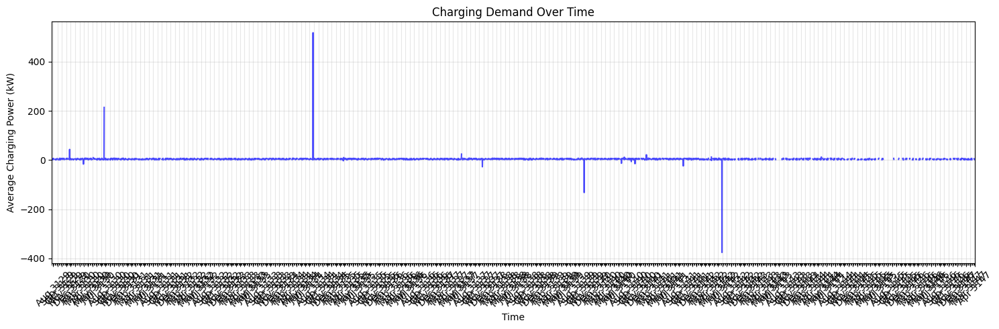

In [16]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

fig, ax = plt.subplots(figsize=(15,5))

# Plot hourly or daily average power
hourly_power.plot(ax=ax, color="blue", alpha=0.7)

# Set major ticks to months
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter("%b %Y"))

# Optional: minor ticks by week
ax.xaxis.set_minor_locator(mdates.WeekdayLocator(byweekday=mdates.MO))

ax.set_ylabel("Average Charging Power (kW)")
ax.set_xlabel("Time")
ax.set_title("Charging Demand Over Time")
plt.xticks(rotation=45)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [17]:
hourly_power.fillna(0, inplace=True)

<Axes: xlabel='connectionTime'>

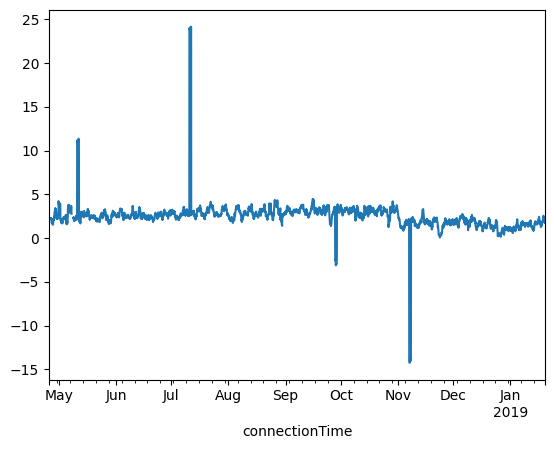

In [18]:
hourly_power.rolling(24).mean().plot()

In [19]:
df_small["avg_power_kW"] = df_small["kWhDelivered"] / df_small["charging_hours"]

In [20]:
df_small[df_small["avg_power_kW"] < 0]

,doneChargingTime,kWhDelivered,charging_hours,avg_power_kW
connectionTime,,,,
2018-05-04 19:08:37,2018-05-04 19:07:40,0.551722,-0.015833,-34.845595
2018-05-04 19:23:52,2018-05-04 19:22:52,0.912297,-0.016667,-54.737814
2018-05-07 20:47:51,2018-05-07 20:47:50,14.967000,-0.000278,-53881.200000
2018-07-19 15:57:19,2018-07-19 15:56:21,1.336511,-0.016111,-82.955877
2018-08-29 05:25:08,2018-08-29 05:24:11,1.416971,-0.015833,-89.492926
2018-09-11 15:15:01,2018-09-11 15:14:02,1.050226,-0.016389,-64.081556
2018-09-27 22:58:45,2018-09-27 22:57:45,4.443405,-0.016667,-266.604301
2018-10-08 19:14:32,2018-10-08 19:13:32,1.104249,-0.016667,-66.254928
2018-10-11 15:58:47,2018-10-11 15:57:47,0.714337,-0.016667,-42.860215


In [21]:
df_small = df_small[df_small["avg_power_kW"] > 0]

In [22]:
hourly_energy = {}

for idx, row in df_small.iterrows():

    start = idx   # connectionTime is the index
    end = row["doneChargingTime"]
    energy = row["kWhDelivered"]

    duration = (end - start).total_seconds()

    current = start

    while current < end:

        next_hour = (current + pd.Timedelta(hours=1)).floor("H")

        segment_end = min(end, next_hour)

        segment_seconds = (segment_end - current).total_seconds()

        energy_share = energy * (segment_seconds / duration)

        hour = current.floor("H")

        hourly_energy[hour] = hourly_energy.get(hour, 0) + energy_share

        current = segment_end


hourly_energy = pd.Series(hourly_energy).sort_index()

# hourly power (kWh per hour = kW)
hourly_power = hourly_energy

C:\Users\betsie_0410\AppData\Local\Temp\ipykernel_26008\3507591723.py:15: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  next_hour = (current + pd.Timedelta(hours=1)).floor("H")
C:\Users\betsie_0410\AppData\Local\Temp\ipykernel_26008\3507591723.py:23: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  hour = current.floor("H")


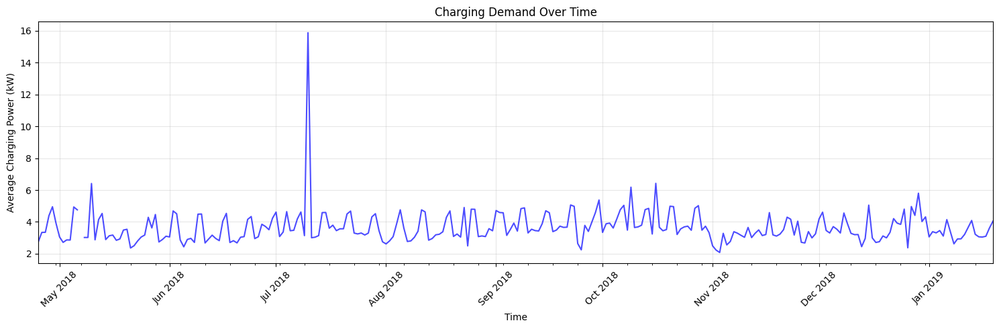

In [23]:
import matplotlib.dates as mdates

fig, ax = plt.subplots(figsize=(15,5))

# Resample to daily averages
daily_power = df_small["avg_power_kW"].resample("D").mean()
daily_power.plot(ax=ax, color="blue", alpha=0.7)

# Major ticks: first day of each month
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter("%b %Y"))

# Optional: minor ticks by week
ax.xaxis.set_minor_locator(mdates.WeekdayLocator(byweekday=mdates.MO))

ax.set_ylabel("Average Charging Power (kW)")
ax.set_xlabel("Time")
ax.set_title("Charging Demand Over Time")
plt.xticks(rotation=45)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

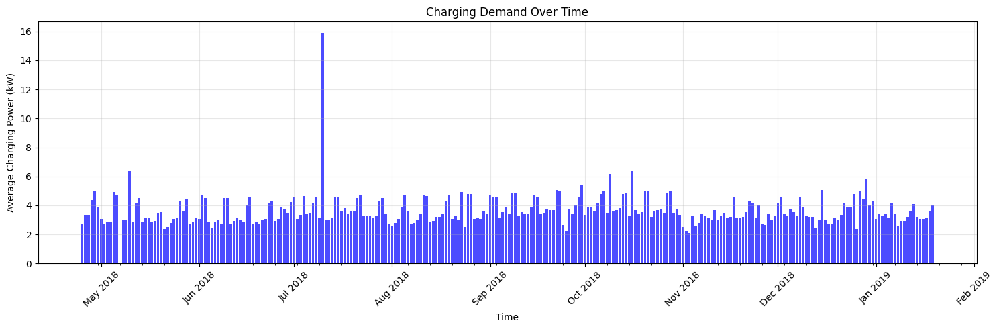

In [24]:
import matplotlib.dates as mdates
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(15,5))

# Resample to daily averages
daily_power = df_small["avg_power_kW"].resample("D").mean()

# Use bars instead of line
ax.bar(daily_power.index, daily_power.values, color="blue", alpha=0.7, width=0.8)

# Major ticks: first day of each month
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter("%b %Y"))

# Optional: minor ticks by week
ax.xaxis.set_minor_locator(mdates.WeekdayLocator(byweekday=mdates.MO))

ax.set_ylabel("Average Charging Power (kW)")
ax.set_xlabel("Time")
ax.set_title("Charging Demand Over Time")
plt.xticks(rotation=45)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

C:\Users\betsie_0410\AppData\Local\Temp\ipykernel_26008\699986044.py:10: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  hourly_data = df_small["avg_power_kW"].resample("H").mean().reindex(
C:\Users\betsie_0410\AppData\Local\Temp\ipykernel_26008\699986044.py:11: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pd.date_range(df_small.index.min().normalize(),


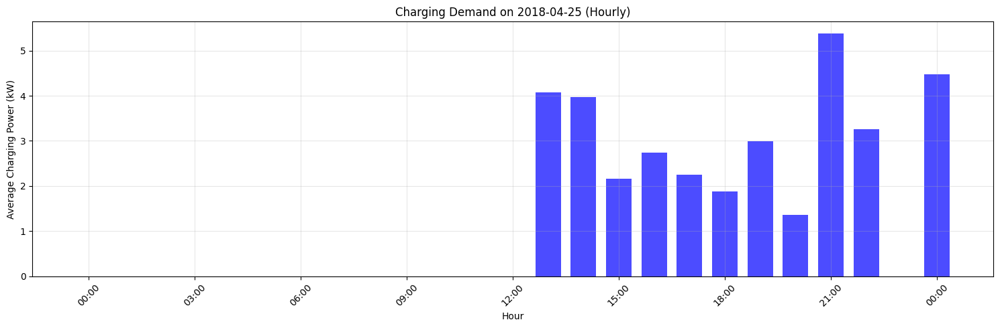

In [25]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Make sure index is datetime
df_small.index = pd.to_datetime(df_small.index)

# Resample hourly to ensure uniform time steps
#hourly_data = df_small["avg_power_kW"].resample("H").mean()
hourly_data = df_small["avg_power_kW"].resample("H").mean().reindex(
    pd.date_range(df_small.index.min().normalize(),
                  df_small.index.max().normalize() + pd.Timedelta(days=1),
                  freq='H')
)

# Group by day and find days that have 24 hourly entries
complete_days = hourly_data.groupby(hourly_data.index.date).filter(lambda x: len(x) == 24)

# Get the first complete day
if not complete_days.empty:
    first_day_date = complete_days.index[0].normalize()  # midnight of first full day
    hourly_power = hourly_data[first_day_date:first_day_date + pd.Timedelta(days=1)]
    hourly_power = hourly_power.fillna(0)
#    hourly_power = hourly_data.loc[first_day_date:first_day_date + pd.Timedelta(days=1)].reindex(
#        pd.date_range(first_day_date, periods=24, freq='H')
#   )
else:
    raise ValueError("No day with complete 24 hours of data found.")

# Plot
fig, ax = plt.subplots(figsize=(15,5))
ax.bar(hourly_power.index, hourly_power.values, color="blue", alpha=0.7, width=0.03)

# Format x-axis to show hours
ax.xaxis.set_major_formatter(mdates.DateFormatter("%H:%M"))
ax.set_ylabel("Average Charging Power (kW)")
ax.set_xlabel("Hour")
ax.set_title(f"Charging Demand on {first_day_date.date()} (Hourly)")

plt.xticks(rotation=45)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

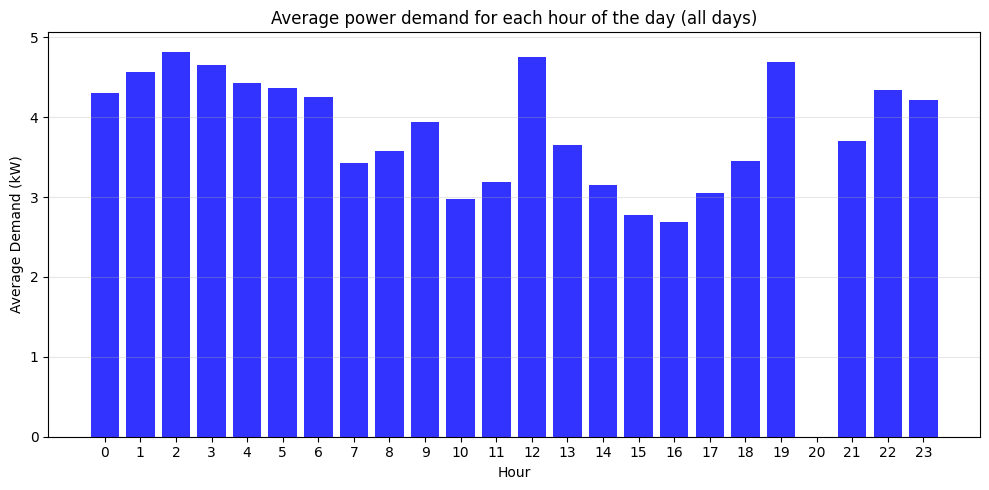

In [26]:
import pandas as pd
import matplotlib.pyplot as plt

# Compute hourly mean
hourly_avg = df_small["avg_power_kW"].groupby(df_small.index.hour).mean()

# Ensure all 24 hours are present
hourly_avg = hourly_avg.reindex(range(24), fill_value=0)  # or use fill_value=np.nan

# Plot
fig, ax = plt.subplots(figsize=(10,5))
ax.bar(hourly_avg.index, hourly_avg.values, color="blue", alpha=0.8)

ax.set_xlabel("Hour")
ax.set_ylabel("Average Demand (kW)")
ax.set_title("Average power demand for each hour of the day (all days)")
ax.set_xticks(range(24))
plt.grid(alpha=0.3, axis='y')
plt.tight_layout()
plt.show()

In [27]:
daily_power = hourly_power.resample("D").mean()

In [28]:
hourly_avg = hourly_power.groupby(hourly_power.index.hour).mean()
hourly_avg = hourly_avg.reindex(range(24), fill_value=0)

In [29]:
day = hourly_power.index[0].normalize()
one_day = hourly_power[day:day + pd.Timedelta(days=1)]

In [30]:
hourly_power_kw = hourly_power

In [31]:
print(df_small.index.min())
print(df_small.index.max())

2018-04-25 13:45:10
2019-01-19 21:10:05


In [32]:
# Make a proper copy
df_small = df[['connectionTime', 'doneChargingTime', 'kWhDelivered']].copy()

# Convert to datetime
df_small['connectionTime'] = pd.to_datetime(df_small['connectionTime'], errors='coerce')
df_small['doneChargingTime'] = pd.to_datetime(df_small['doneChargingTime'], errors='coerce')

# Drop rows with invalid datetimes
df_small = df_small.dropna(subset=['connectionTime', 'doneChargingTime'])

# Compute charging duration in hours
df_small['charging_hours'] = (df_small['doneChargingTime'] - df_small['connectionTime']).dt.total_seconds() / 3600

# Compute average power
df_small['avg_power_kW'] = df_small['kWhDelivered'] / df_small['charging_hours']

# Keep only positive power sessions
df_small = df_small[df_small['avg_power_kW'] > 0].copy()

print(df_small.head())
print(df_small.info())

       connectionTime    doneChargingTime  kWhDelivered  charging_hours  \
0 2018-04-25 13:45:10 2018-04-25 16:44:15        10.013        2.984722   
1 2018-04-25 13:45:50 2018-04-25 14:51:44         5.257        1.098333   
2 2018-04-25 14:37:06 2018-04-25 16:05:22         5.177        1.471111   
3 2018-04-25 14:40:34 2018-04-25 17:40:30        10.119        2.998889   
4 2018-04-25 14:43:50 2018-04-25 16:18:28         7.910        1.577222   

   avg_power_kW  
0      3.354751  
1      4.786343  
2      3.519109  
3      3.374250  
4      5.015146  
<class 'pandas.core.frame.DataFrame'>
Index: 15206 entries, 0 to 16051
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   connectionTime    15206 non-null  datetime64[ns]
 1   doneChargingTime  15206 non-null  datetime64[ns]
 2   kWhDelivered      15206 non-null  float64       
 3   charging_hours    15206 non-null  float64       
 4   avg_power

In [33]:
import pandas as pd
import numpy as np

# Ensure datetimes
df_small["connectionTime"] = pd.to_datetime(df_small["connectionTime"])
df_small["doneChargingTime"] = pd.to_datetime(df_small["doneChargingTime"])

# Remove invalid durations
df_small = df_small[df_small["doneChargingTime"] > df_small["connectionTime"]]

# Compute duration in seconds
df_small["duration_s"] = (df_small["doneChargingTime"] - df_small["connectionTime"]).dt.total_seconds()

# Create a Series with hourly energy for each row
def split_to_hours(row):
    # Generate hourly intervals covering the session
    hours = pd.date_range(
        row["connectionTime"].floor("H"),
        row["doneChargingTime"].ceil("H"),
        freq="H"
    )
    # Compute fraction of energy in each hour
    frac = []
    for h in range(len(hours)-1):
        seg_start = max(row["connectionTime"], hours[h])
        seg_end = min(row["doneChargingTime"], hours[h+1])
        frac.append((seg_end - seg_start).total_seconds() / row["duration_s"])
    # Return Series: index=hour, values=energy_share
    return pd.Series(np.array(frac) * row["kWhDelivered"], index=hours[:-1])

# Apply vectorized split
hourly_energy_series = df_small.apply(split_to_hours, axis=1).stack()
hourly_energy_series.index = hourly_energy_series.index.droplevel(1)
hourly_energy = hourly_energy_series.groupby(level=0).sum().sort_index()

# Ensure all hours are present
hourly_power = hourly_energy.asfreq("H", fill_value=0)

C:\Users\betsie_0410\AppData\Local\Temp\ipykernel_26008\4051442858.py:18: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  row["connectionTime"].floor("H"),
C:\Users\betsie_0410\AppData\Local\Temp\ipykernel_26008\4051442858.py:19: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  row["doneChargingTime"].ceil("H"),
C:\Users\betsie_0410\AppData\Local\Temp\ipykernel_26008\4051442858.py:17: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  hours = pd.date_range(
C:\Users\betsie_0410\AppData\Local\Temp\ipykernel_26008\4051442858.py:37: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  hourly_power = hourly_energy.asfreq("H", fill_value=0)


Compute hourly energy from sessions

In [34]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Make sure index is datetime
df_small = df_small.set_index('connectionTime')

# Allocate energy to hours proportionally
hourly_energy = {}

for idx, row in df_small.iterrows():
    start = idx
    end = row['doneChargingTime']
    energy = row['kWhDelivered']
    duration = (end - start).total_seconds()
    
    current = start
    while current < end:
        # End of current hour
        next_hour = (current + pd.Timedelta(hours=1)).floor('H')
        segment_end = min(end, next_hour)
        
        # Proportion of energy for this segment
        segment_seconds = (segment_end - current).total_seconds()
        energy_share = energy * (segment_seconds / duration)
        
        hour = current.floor('H')
        hourly_energy[hour] = hourly_energy.get(hour, 0) + energy_share
        
        current = segment_end

# Convert to Series and sort
hourly_energy = pd.Series(hourly_energy).sort_index()

# Convert kWh per hour to average kW in that hour
hourly_power = hourly_energy  # 1 kWh in 1 hour = 1 kW

C:\Users\betsie_0410\AppData\Local\Temp\ipykernel_26008\588346311.py:20: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  next_hour = (current + pd.Timedelta(hours=1)).floor('H')
C:\Users\betsie_0410\AppData\Local\Temp\ipykernel_26008\588346311.py:27: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  hour = current.floor('H')


Daily average power plot (bar)

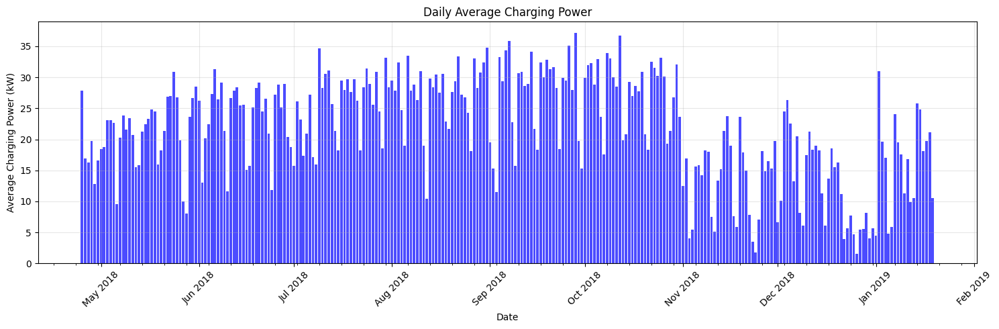

In [35]:
daily_power = hourly_power.resample('D').mean()

fig, ax = plt.subplots(figsize=(15,5))
ax.bar(daily_power.index, daily_power.values, color='blue', alpha=0.7, width=0.8)

ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
ax.xaxis.set_minor_locator(mdates.WeekdayLocator(byweekday=mdates.MO))

ax.set_ylabel("Average Charging Power (kW)")
ax.set_xlabel("Date")
ax.set_title("Daily Average Charging Power")
plt.xticks(rotation=45)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

Hourly profile (average per hour of day)

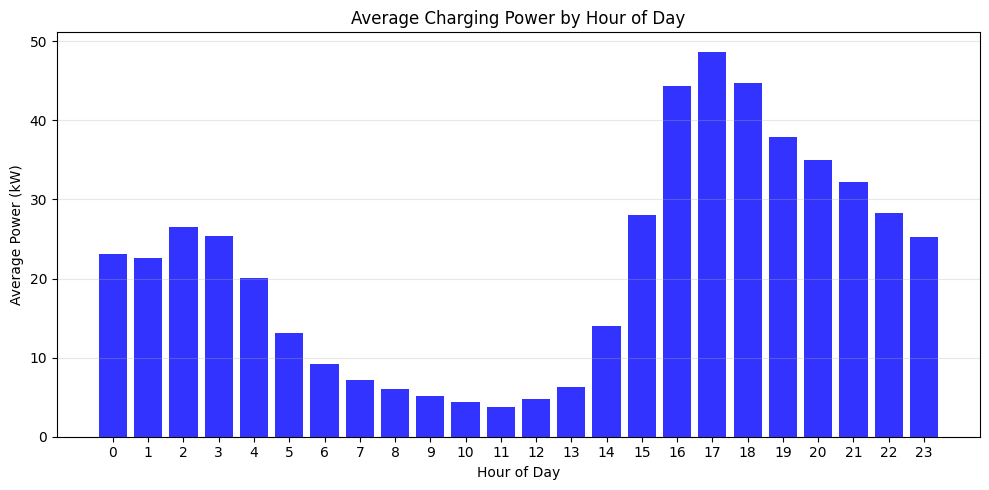

In [36]:
# Group by hour of day
hourly_avg = hourly_power.groupby(hourly_power.index.hour).mean()
hourly_avg = hourly_avg.reindex(range(24), fill_value=0)  # ensure 24 hours

fig, ax = plt.subplots(figsize=(10,5))
ax.bar(hourly_avg.index, hourly_avg.values, color='blue', alpha=0.8)

ax.set_xlabel("Hour of Day")
ax.set_ylabel("Average Power (kW)")
ax.set_title("Average Charging Power by Hour of Day")
ax.set_xticks(range(24))
plt.grid(alpha=0.3, axis='y')
plt.tight_layout()
plt.show()

Compute average demand per day of the week

In [37]:
import matplotlib.pyplot as plt

# Convert index to datetime if needed
hourly_power.index = pd.to_datetime(hourly_power.index)

# Compute average power per weekday
weekday_avg = hourly_power.groupby(hourly_power.index.dayofweek).mean()

# Map numbers to weekday names
weekday_names = ["Mon","Tue","Wed","Thu","Fri","Sat","Sun"]
weekday_avg.index = weekday_names

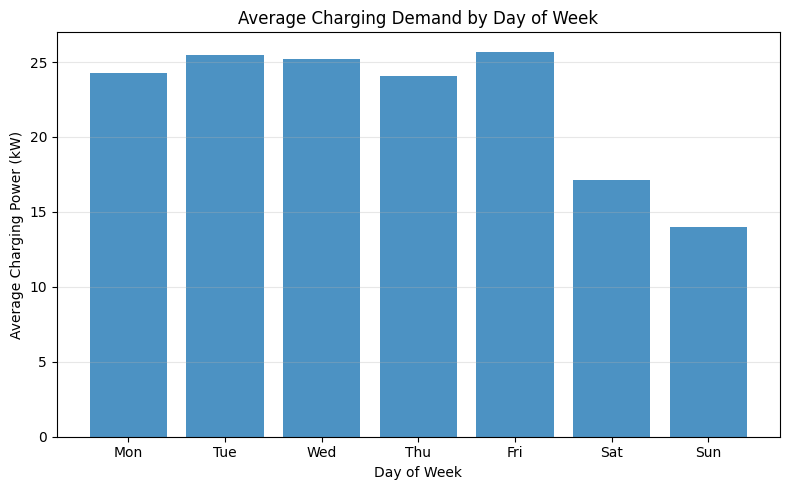

In [38]:
fig, ax = plt.subplots(figsize=(8,5))

ax.bar(weekday_avg.index, weekday_avg.values, alpha=0.8)

ax.set_xlabel("Day of Week")
ax.set_ylabel("Average Charging Power (kW)")
ax.set_title("Average Charging Demand by Day of Week")

plt.grid(axis="y", alpha=0.3)
plt.tight_layout()
plt.show()

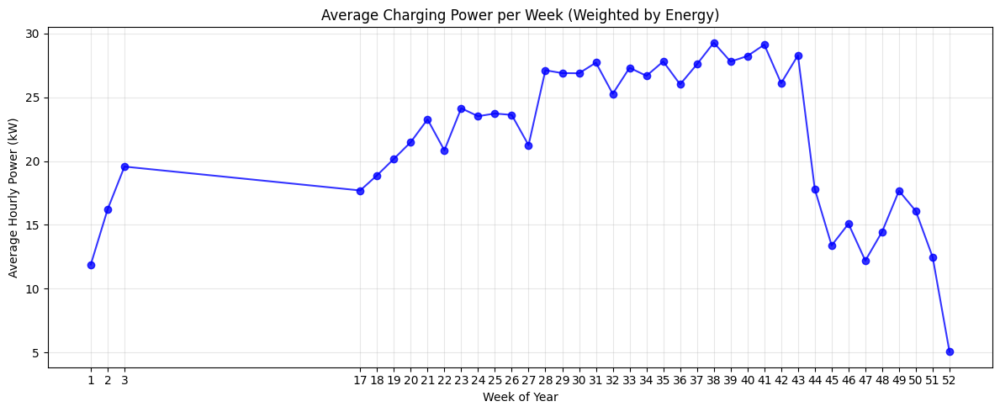

In [39]:
import pandas as pd
import matplotlib.pyplot as plt

# Make sure index is datetime
df_small.index = pd.to_datetime(df_small.index)

# Compute session duration in hours
df_small["session_hours"] = (df_small["doneChargingTime"] - df_small.index).dt.total_seconds() / 3600

# Compute hourly energy delivered
hourly_energy = {}

for idx, row in df_small.iterrows():
    start = idx
    end = row["doneChargingTime"]
    energy = row["kWhDelivered"]
    duration = (end - start).total_seconds()
    
    current = start
    while current < end:
        next_hour = (current + pd.Timedelta(hours=1)).floor("h")
        segment_end = min(end, next_hour)
        segment_seconds = (segment_end - current).total_seconds()
        energy_share = energy * (segment_seconds / duration)
        hour = current.floor("h")
        hourly_energy[hour] = hourly_energy.get(hour, 0) + energy_share
        current = segment_end

hourly_energy_series = pd.Series(hourly_energy).sort_index()

# Add week number
hourly_df = hourly_energy_series.to_frame(name="kWh")
hourly_df['week_of_year'] = hourly_df.index.isocalendar().week

# Compute average power per week (kW = kWh per 1 hour)
weekly_avg_power = hourly_df.groupby('week_of_year')['kWh'].mean()

# Plot
plt.figure(figsize=(12,5))
plt.plot(weekly_avg_power.index, weekly_avg_power.values, marker='o', color='blue', alpha=0.8)
plt.xlabel("Week of Year")
plt.ylabel("Average Hourly Power (kW)")
plt.title("Average Charging Power per Week (Weighted by Energy)")
plt.grid(alpha=0.3)
plt.xticks(weekly_avg_power.index)
plt.tight_layout()
plt.show()

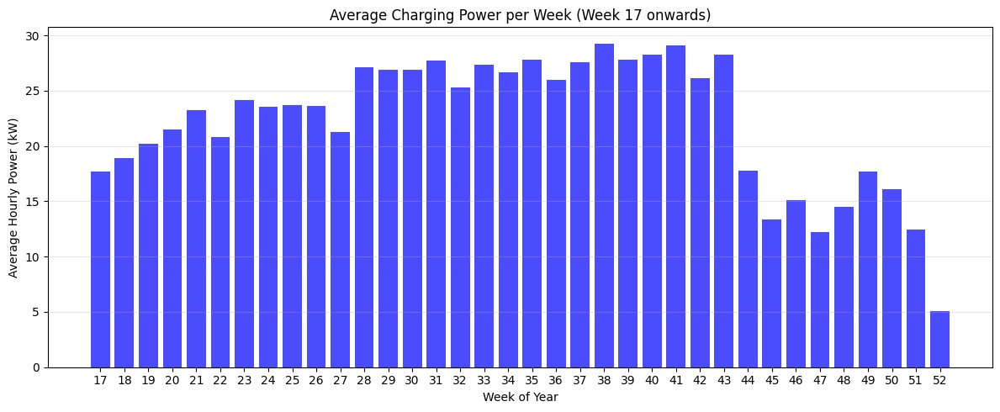

In [40]:
import matplotlib.pyplot as plt

# Filter weeks starting from week 17
weekly_subset = weekly_avg_power[weekly_avg_power.index >= 17]

# Bar plot
plt.figure(figsize=(12,5))
plt.bar(weekly_subset.index, weekly_subset.values, color='blue', alpha=0.7)
plt.xlabel("Week of Year")
plt.ylabel("Average Hourly Power (kW)")
plt.title("Average Charging Power per Week (Week 17 onwards)")
plt.grid(alpha=0.3, axis='y')
plt.xticks(weekly_subset.index)
plt.tight_layout()
plt.show()

Outlier Removal Using IQR

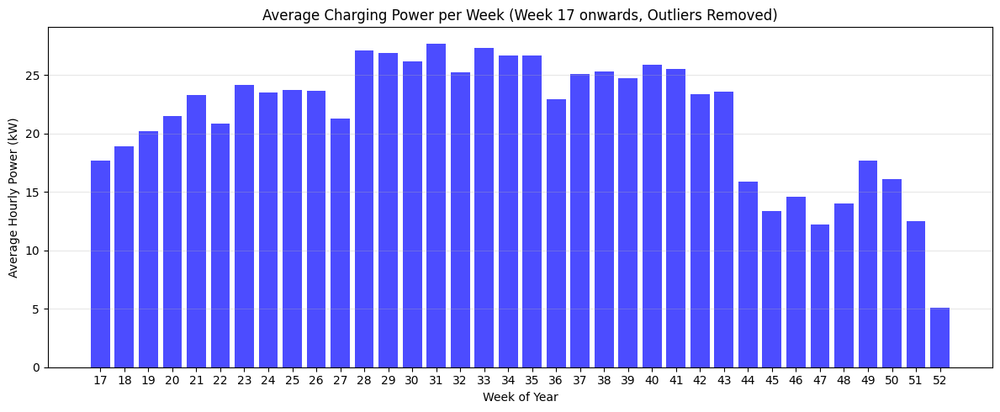

In [41]:
import pandas as pd
import matplotlib.pyplot as plt

# --- Step 1: Remove outliers using IQR ---
Q1 = hourly_energy_series.quantile(0.25)
Q3 = hourly_energy_series.quantile(0.75)
IQR = Q3 - Q1
filtered_series = hourly_energy_series[(hourly_energy_series >= Q1 - 1.5*IQR) &
                                       (hourly_energy_series <= Q3 + 1.5*IQR)]

# --- Step 2: Convert to DataFrame and add week number ---
hourly_df = filtered_series.to_frame(name="kWh")
hourly_df['week_of_year'] = hourly_df.index.isocalendar().week

# --- Step 3: Compute weekly average power ---
weekly_avg_power = hourly_df.groupby('week_of_year')['kWh'].mean()

# --- Step 4: Select weeks >= 17 ---
weekly_subset = weekly_avg_power[weekly_avg_power.index >= 17]

# --- Step 5: Bar plot ---
plt.figure(figsize=(12,5))
plt.bar(weekly_subset.index, weekly_subset.values, color='blue', alpha=0.7)
plt.xlabel("Week of Year")
plt.ylabel("Average Hourly Power (kW)")
plt.title("Average Charging Power per Week (Week 17 onwards, Outliers Removed)")
plt.grid(alpha=0.3, axis='y')
plt.xticks(weekly_subset.index)
plt.tight_layout()
plt.show()

At the hourly level (original data)

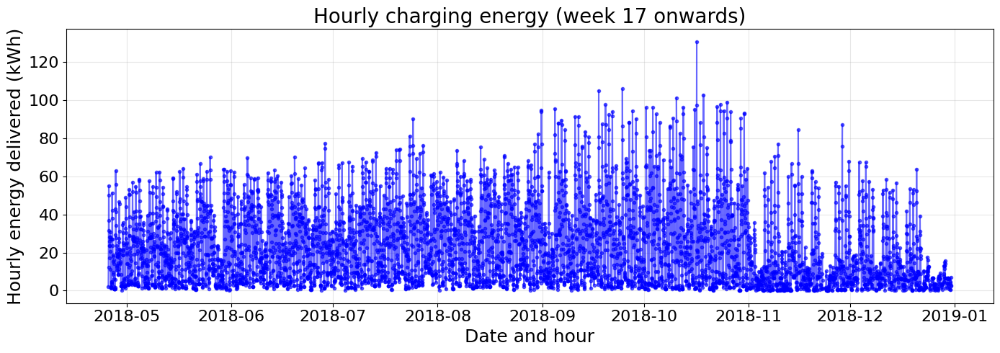

In [42]:
import pandas as pd
import matplotlib.pyplot as plt

# --- Step 1: Convert original hourly series to DataFrame and add week number ---
hourly_df = hourly_energy_series.to_frame(name="kWh")
hourly_df['week_of_year'] = hourly_df.index.isocalendar().week

# --- Step 2: Keep only hours from week 17 onwards ---
hourly_subset = hourly_df[hourly_df['week_of_year'] >= 17]

# --- Step 3: Plot hourly data ---
plt.figure(figsize=(14,5))
plt.plot(hourly_subset.index, hourly_subset['kWh'], marker='.', linestyle='-', color='blue', alpha=0.6)
plt.xlabel("Date and hour", fontsize=18)
plt.ylabel("Hourly energy delivered (kWh)", fontsize=18)
plt.grid(alpha=0.3)
# Title size
plt.title("Hourly charging energy (week 17 onwards)", fontsize=20)
# Tick label sizes
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.tight_layout()
plt.show()

At the hourly level (outliers removed)

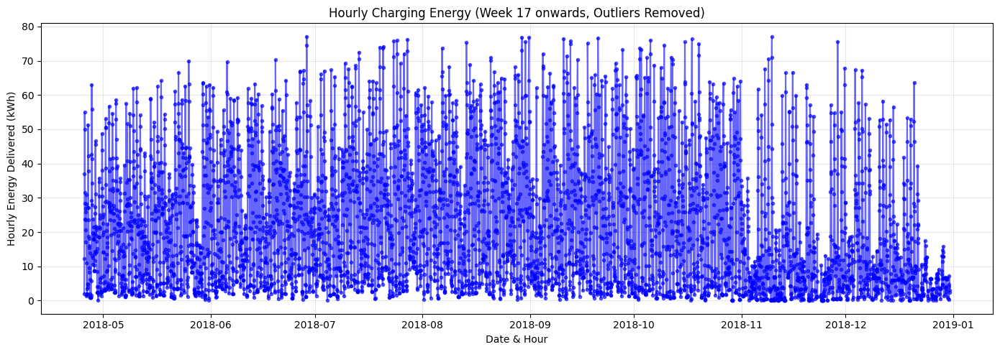

In [43]:
import pandas as pd
import matplotlib.pyplot as plt

# --- Step 1: Remove outliers from hourly data using IQR ---
Q1 = hourly_energy_series.quantile(0.25)
Q3 = hourly_energy_series.quantile(0.75)
IQR = Q3 - Q1
filtered_hourly = hourly_energy_series[(hourly_energy_series >= Q1 - 1.5*IQR) &
                                       (hourly_energy_series <= Q3 + 1.5*IQR)]

# --- Step 2: Convert to DataFrame and add week number ---
hourly_df = filtered_hourly.to_frame(name="kWh")
hourly_df['week_of_year'] = hourly_df.index.isocalendar().week

# --- Step 3: Keep only hours from week 17 onwards ---
hourly_subset = hourly_df[hourly_df['week_of_year'] >= 17]

# --- Step 4: Plot hourly data ---
plt.figure(figsize=(14,5))
plt.plot(hourly_subset.index, hourly_subset['kWh'], marker='.', linestyle='-', color='blue', alpha=0.6)
plt.xlabel("Date & Hour")
plt.ylabel("Hourly Energy Delivered (kWh)")
plt.title("Hourly Charging Energy (Week 17 onwards, Outliers Removed)")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

Min-Max Normalization

In [44]:
# Min-max normalization of hourly energy
hourly_subset['kWh_norm'] = (hourly_subset['kWh'] - hourly_subset['kWh'].min()) / \
                             (hourly_subset['kWh'].max() - hourly_subset['kWh'].min())

C:\Users\betsie_0410\AppData\Local\Temp\ipykernel_26008\3969204589.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hourly_subset['kWh_norm'] = (hourly_subset['kWh'] - hourly_subset['kWh'].min()) / \


Feature Addition (as done in the paper)

In [45]:
hourly_subset['ConnectionHour'] = hourly_subset.index.hour
hourly_subset['DayofWeek'] = hourly_subset.index.dayofweek   # 0=Monday, 6=Sunday
hourly_subset['Week'] = hourly_subset.index.isocalendar().week
hourly_subset['WorkingStatus'] = hourly_subset['DayofWeek'].apply(lambda x: 0 if x>=5 else 1)  # 0=holiday, 1=working day

# Hourly average demand (average energy for that hour across all days)
hourly_subset['HourlyAverageDemand'] = hourly_subset.groupby('ConnectionHour')['kWh'].transform('mean')

# Previous 24-hour average demand
hourly_subset['Previous24HrAverageDemand'] = hourly_subset['kWh'].rolling(24, min_periods=1).mean()

C:\Users\betsie_0410\AppData\Local\Temp\ipykernel_26008\3768178214.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hourly_subset['ConnectionHour'] = hourly_subset.index.hour
C:\Users\betsie_0410\AppData\Local\Temp\ipykernel_26008\3768178214.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hourly_subset['DayofWeek'] = hourly_subset.index.dayofweek   # 0=Monday, 6=Sunday
C:\Users\betsie_0410\AppData\Local\Temp\ipykernel_26008\3768178214.py:3: SettingWithCopyWarning: 
A value is trying to be set on a co

Plot Normalized Hourly Data

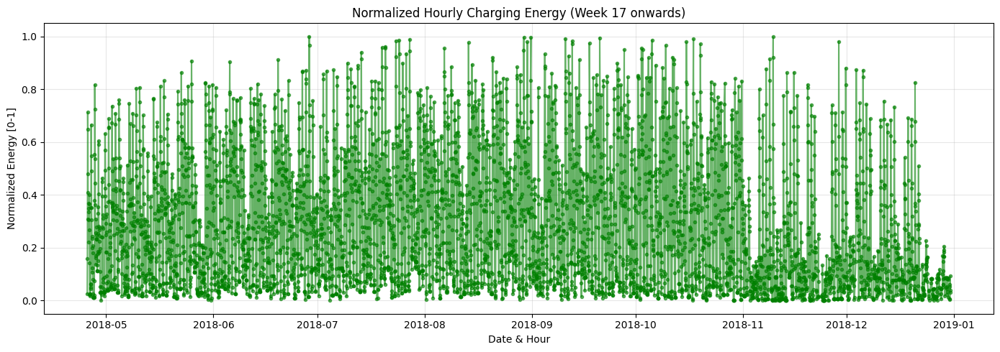

In [46]:
plt.figure(figsize=(14,5))
plt.plot(hourly_subset.index, hourly_subset['kWh_norm'], marker='.', linestyle='-', color='green', alpha=0.6)
plt.xlabel("Date & Hour")
plt.ylabel("Normalized Energy [0-1]")
plt.title("Normalized Hourly Charging Energy (Week 17 onwards)")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

Data partitioning for LSTM:

-Training: data until 31 Oct 2018
-Validation: Nov–Dec 2018
-Test: Jan 2019

In [47]:
# Training: e.g., week 17 to Oct
train_data = hourly_subset[hourly_subset.index <= '2018-10-31']

# Validation: Nov–Dec
val_data = hourly_subset[(hourly_subset.index >= '2018-11-01') & (hourly_subset.index <= '2018-12-31')]

# Test: empty because you don’t have Jan 2019
test_data = hourly_subset[hourly_subset.index >= '2019-01-01']

Do a train/validation split within the available data

In [48]:
# Keep hours from week 17 onwards and include January 2019
hourly_subset = hourly_df[hourly_df.index >= '2018-04-23']  # week 17 of 2018

In [49]:
hourly_subset = hourly_df[hourly_df.index >= '2018-04-23']  # adjust to actual start date

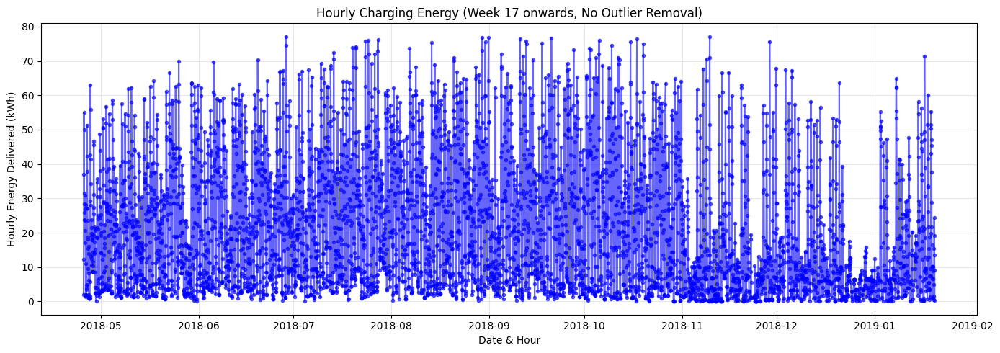

In [50]:
plt.figure(figsize=(14,5))
plt.plot(hourly_subset.index, hourly_subset['kWh'], marker='.', linestyle='-', color='blue', alpha=0.6)
plt.xlabel("Date & Hour")
plt.ylabel("Hourly Energy Delivered (kWh)")
plt.title("Hourly Charging Energy (Week 17 onwards, No Outlier Removal)")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

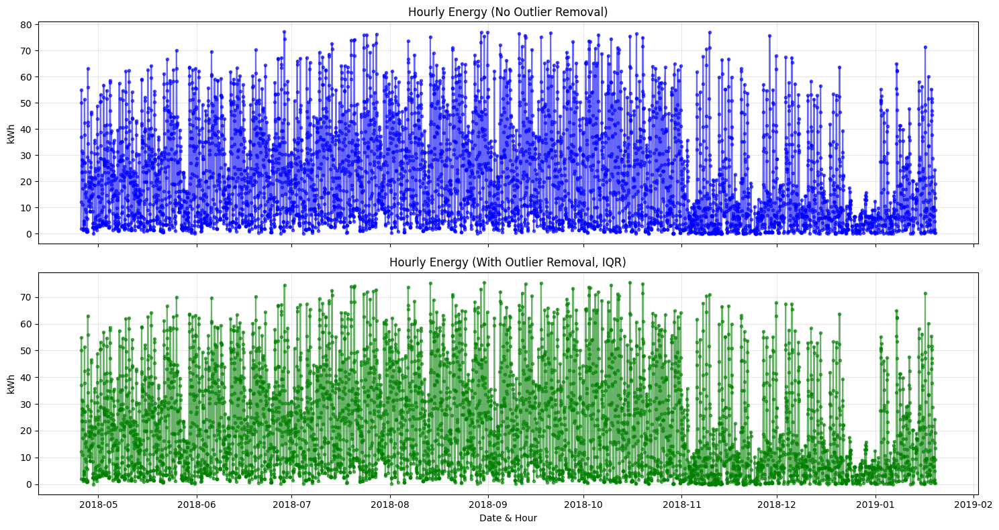

In [51]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats
import numpy as np

# --- Assume hourly_df already exists ---
# Keep all hours from week 17 onwards
hourly_subset = hourly_df[hourly_df.index >= '2018-04-23']  # week 17 start

# --- 1️⃣ Without outlier removal ---
hourly_no_outlier_removal = hourly_subset.copy()

# --- 2️⃣ With outlier removal using IQR ---
Q1 = hourly_subset['kWh'].quantile(0.25)
Q3 = hourly_subset['kWh'].quantile(0.75)
IQR = Q3 - Q1
hourly_with_outlier_removal = hourly_subset[
    (hourly_subset['kWh'] >= Q1 - 1.5*IQR) & 
    (hourly_subset['kWh'] <= Q3 + 1.5*IQR)
]

# --- Plot comparison ---
fig, axs = plt.subplots(2, 1, figsize=(15,8), sharex=True)

# No outlier removal
axs[0].plot(hourly_no_outlier_removal.index, hourly_no_outlier_removal['kWh'],
            marker='.', linestyle='-', color='blue', alpha=0.6)
axs[0].set_title("Hourly Energy (No Outlier Removal)")
axs[0].set_ylabel("kWh")
axs[0].grid(alpha=0.3)

# With outlier removal
axs[1].plot(hourly_with_outlier_removal.index, hourly_with_outlier_removal['kWh'],
            marker='.', linestyle='-', color='green', alpha=0.6)
axs[1].set_title("Hourly Energy (With Outlier Removal, IQR)")
axs[1].set_xlabel("Date & Hour")
axs[1].set_ylabel("kWh")
axs[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

LSTM workflow using your hourly energy data. We’ll include train/validation/test split, optional outlier removal, and min-max normalization, just like the paper describes. We’ll prepare the data for a multivariate LSTM with features like hour of day, day of week, and previous 24-hour averages.

In [298]:
import tensorflow as tf

print("TensorFlow version:", tf.__version__)
print(tf.constant([[1,2],[3,4]]))

TensorFlow version: 2.21.0
tf.Tensor(
[[1 2]
 [3 4]], shape=(2, 2), dtype=int32)


Epoch 1/30


c:\Users\betsie_0410\energiapy\.conda\lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0736 - val_loss: 0.0370
Epoch 2/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0410 - val_loss: 0.0477
Epoch 3/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0365 - val_loss: 0.0460
Epoch 4/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0343 - val_loss: 0.0434
Epoch 5/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0304 - val_loss: 0.0392
Epoch 6/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0246 - val_loss: 0.0344
Epoch 7/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0213 - val_loss: 0.0333
Epoch 8/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0199 - val_loss: 0.0322
Epoch 9/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0197 - val_loss: 0.0372
Epoch 10/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0192 - val_loss: 0.0354
Epoch 11/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0185 - val_loss: 0.0365
Epoch 12/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0179 - val_l

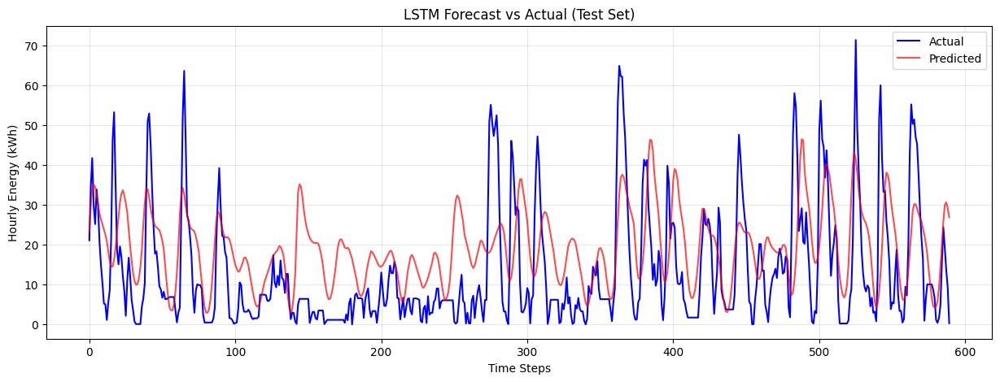

In [299]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, ReLU
from tensorflow.keras.callbacks import EarlyStopping

# -----------------------------
# 1️⃣ Prepare data
# -----------------------------
# Assume hourly_df exists with columns: ['kWh'], index=datetime
hourly_subset = hourly_df[hourly_df.index >= '2018-04-23'].copy()  # week 17 onwards

# Optional: remove outliers using IQR
Q1 = hourly_subset['kWh'].quantile(0.25)
Q3 = hourly_subset['kWh'].quantile(0.75)
IQR = Q3 - Q1
hourly_subset = hourly_subset[(hourly_subset['kWh'] >= Q1 - 1.5*IQR) &
                              (hourly_subset['kWh'] <= Q3 + 1.5*IQR)]

# Add features
hourly_subset['ConnectionHour'] = hourly_subset.index.hour
hourly_subset['DayOfWeek'] = hourly_subset.index.dayofweek
hourly_subset['Previous24HrAvg'] = hourly_subset['kWh'].rolling(24, min_periods=1).mean()

features = ['ConnectionHour', 'DayOfWeek', 'Previous24HrAvg', 'kWh']  # multivariate including target

# -----------------------------
# 2️⃣ Train/Val/Test Split
# -----------------------------
train_df = hourly_subset[hourly_subset.index <= '2018-10-31']
val_df   = hourly_subset[(hourly_subset.index >= '2018-11-01') & (hourly_subset.index <= '2018-12-31')]
test_df  = hourly_subset[hourly_subset.index >= '2018-12-15']  # last 2 weeks as test

# -----------------------------
# 3️⃣ Normalize
# -----------------------------
scaler = MinMaxScaler()
train_scaled = scaler.fit_transform(train_df[features])
val_scaled   = scaler.transform(val_df[features])
test_scaled  = scaler.transform(test_df[features])

# -----------------------------
# 4️⃣ Create sequences
# -----------------------------
def create_sequences(data, seq_length=48):
    X, y = [], []
    for i in range(seq_length, len(data)):
        X.append(data[i-seq_length:i, :-1])
        y.append(data[i, -1])
    return np.array(X), np.array(y)

seq_length = 48
X_train, y_train = create_sequences(train_scaled, seq_length)
X_val, y_val     = create_sequences(val_scaled, seq_length)
X_test, y_test   = create_sequences(test_scaled, seq_length)

# -----------------------------
# 5️⃣ Build LSTM model (Keras)
# -----------------------------
input_shape = X_train.shape[1:]  # (seq_length, num_features-1)

model = Sequential([
    LSTM(50, input_shape=input_shape, return_sequences=False),
    Dense(50),
    ReLU(),
    Dense(1)
])

model.compile(optimizer='adam', loss='mse')

# Optional early stopping
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# -----------------------------
# 6️⃣ Train
# -----------------------------
history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=30,
    batch_size=192,
    callbacks=[early_stop],
    verbose=1
)

# -----------------------------
# 7️⃣ Test predictions
# -----------------------------
test_pred = model.predict(X_test)

# Inverse scaling for plotting
y_test_inv = scaler.inverse_transform(
    np.hstack([np.zeros((y_test.shape[0], len(features)-1)), y_test.reshape(-1,1)])
)[:,-1]

test_pred_inv = scaler.inverse_transform(
    np.hstack([np.zeros((test_pred.shape[0], len(features)-1)), test_pred])
)[:,-1]

# -----------------------------
# 8️⃣ Plot
# -----------------------------
plt.figure(figsize=(15,5))
plt.plot(y_test_inv, label='Actual', color='blue')
plt.plot(test_pred_inv, label='Predicted', color='red', alpha=0.7)
plt.title("LSTM Forecast vs Actual (Test Set)")
plt.xlabel("Time Steps")
plt.ylabel("Hourly Energy (kWh)")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

Epoch 1/50


C:\Users\betsie_0410\AppData\Local\Temp\ipykernel_18288\1545081451.py:26: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  hourly_subset['lag_1'] = hourly_subset['kWh'].shift(1).fillna(method='bfill')
C:\Users\betsie_0410\AppData\Local\Temp\ipykernel_18288\1545081451.py:27: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  hourly_subset['lag_2'] = hourly_subset['kWh'].shift(2).fillna(method='bfill')
C:\Users\betsie_0410\AppData\Local\Temp\ipykernel_18288\1545081451.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  hourly_subset['lag_3'] = hourly_subset['kWh'].shift(3).fillna(method='bfill')
c:\Users\betsie_0410\energiapy\.conda\lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_d

66/66 - 5s - 71ms/step - loss: 0.3468 - val_loss: 0.3945
Epoch 2/50
66/66 - 3s - 48ms/step - loss: 0.2862 - val_loss: 0.4727
Epoch 3/50
66/66 - 3s - 48ms/step - loss: 0.2701 - val_loss: 0.4119
Epoch 4/50
66/66 - 3s - 48ms/step - loss: 0.2623 - val_loss: 0.3460
Epoch 5/50
66/66 - 3s - 48ms/step - loss: 0.2528 - val_loss: 0.3517
Epoch 6/50
66/66 - 3s - 47ms/step - loss: 0.2444 - val_loss: 0.3691
Epoch 7/50
66/66 - 3s - 48ms/step - loss: 0.2466 - val_loss: 0.3850
Epoch 8/50
66/66 - 3s - 48ms/step - loss: 0.2432 - val_loss: 0.3470
Epoch 9/50
66/66 - 3s - 48ms/step - loss: 0.2406 - val_loss: 0.3638
Epoch 10/50
66/66 - 3s - 47ms/step - loss: 0.2357 - val_loss: 0.3455
Epoch 11/50
66/66 - 3s - 48ms/step - loss: 0.2327 - val_loss: 0.3081
Epoch 12/50
66/66 - 3s - 48ms/step - loss: 0.2294 - val_loss: 0.3340
Epoch 13/50
66/66 - 3s - 49ms/step - loss: 0.2299 - val_loss: 0.3152
Epoch 14/50
66/66 - 3s - 48ms/step - loss: 0.2301 - val_loss: 0.3418
Epoch 15/50
66/66 - 3s - 49ms/step - loss: 0.2272 - va

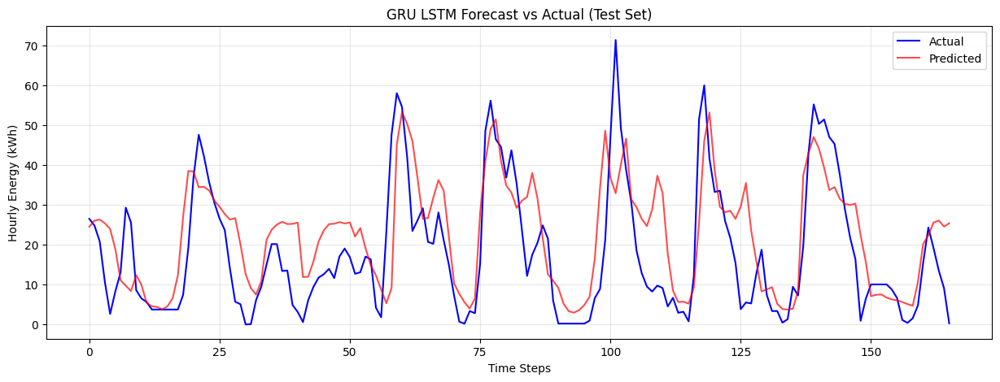

In [304]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import RobustScaler
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, GRU, Dense, Dropout

# -----------------------------
# 1️⃣ Prepare data
# -----------------------------
hourly_subset = hourly_df[hourly_df.index >= '2018-04-23'].copy()  # week 17 onwards

# Optional: remove outliers using IQR
Q1 = hourly_subset['kWh'].quantile(0.25)
Q3 = hourly_subset['kWh'].quantile(0.75)
IQR = Q3 - Q1
hourly_subset = hourly_subset[(hourly_subset['kWh'] >= Q1 - 1.5*IQR) &
                              (hourly_subset['kWh'] <= Q3 + 1.5*IQR)]

# Add time features
hourly_subset['Hour'] = hourly_subset.index.hour
hourly_subset['DayOfWeek'] = hourly_subset.index.dayofweek

# Add lag features
hourly_subset['lag_1'] = hourly_subset['kWh'].shift(1).fillna(method='bfill')
hourly_subset['lag_2'] = hourly_subset['kWh'].shift(2).fillna(method='bfill')
hourly_subset['lag_3'] = hourly_subset['kWh'].shift(3).fillna(method='bfill')

features = ['Hour', 'DayOfWeek', 'lag_1', 'lag_2', 'lag_3', 'kWh']

# -----------------------------
# 2️⃣ Train/Val/Test Split
# -----------------------------
# Training: up to 31 October 2018
train_df = hourly_subset[hourly_subset.index <= '2018-10-31']
# Validation: November + December 2018
val_df   = hourly_subset[(hourly_subset.index >= '2018-11-01') & (hourly_subset.index <= '2018-12-31')]
# Test: January 2019
test_df  = hourly_subset[(hourly_subset.index >= '2019-01-01') & (hourly_subset.index <= '2019-01-31')]

# -----------------------------
# 3️⃣ Normalize
# -----------------------------
scaler = RobustScaler()
train_scaled = scaler.fit_transform(train_df[features])
val_scaled   = scaler.transform(val_df[features])
test_scaled  = scaler.transform(test_df[features])

# -----------------------------
# 4️⃣ Create sequences
# -----------------------------
def create_sequences(data, seq_length=168):
    X, y = [], []
    for i in range(seq_length, len(data)):
        X.append(data[i-seq_length:i, :-1])
        y.append(data[i, -1])
    return np.array(X), np.array(y)

seq_length = 168
X_train, y_train = create_sequences(train_scaled, seq_length)
X_val, y_val     = create_sequences(val_scaled, seq_length)
X_test, y_test   = create_sequences(test_scaled, seq_length)

# -----------------------------
# 5️⃣ Build LSTM/GRU model
# -----------------------------
model = Sequential([
    GRU(64, return_sequences=True, input_shape=(seq_length, X_train.shape[2])),
    Dropout(0.2),
    GRU(32),
    Dropout(0.2),
    Dense(32, activation='relu'),
    Dense(1)
])

model.compile(optimizer=tf.keras.optimizers.Adam(0.001), loss='mae')

# -----------------------------
# 6️⃣ Train
# -----------------------------
history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=50,
    batch_size=64,
    verbose=2
)

# -----------------------------
# 7️⃣ Test predictions
# -----------------------------
test_pred = model.predict(X_test)

# Inverse scaling for plotting
target_scaler = RobustScaler()
y_train_scaled = target_scaler.fit_transform(train_df[['kWh']])
y_val_scaled   = target_scaler.transform(val_df[['kWh']])
y_test_scaled  = target_scaler.transform(test_df[['kWh']])

# After predicting
test_pred_inv = target_scaler.inverse_transform(test_pred)
y_test_inv    = target_scaler.inverse_transform(y_test.reshape(-1,1))

# -----------------------------
# 8️⃣ Plot
# -----------------------------
plt.figure(figsize=(15,5))
plt.plot(y_test_inv, label='Actual', color='blue')
plt.plot(test_pred_inv, label='Predicted', color='red', alpha=0.7)
plt.title("GRU LSTM Forecast vs Actual (Test Set)")
plt.xlabel("Time Steps")
plt.ylabel("Hourly Energy (kWh)")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

Epoch 1/50


C:\Users\betsie_0410\AppData\Local\Temp\ipykernel_18288\3454896543.py:27: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  hourly_subset['lag_1'] = hourly_subset['kWh'].shift(1).fillna(method='bfill')
C:\Users\betsie_0410\AppData\Local\Temp\ipykernel_18288\3454896543.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  hourly_subset['lag_24'] = hourly_subset['kWh'].shift(24).fillna(method='bfill')  # previous day same hour
c:\Users\betsie_0410\energiapy\.conda\lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


66/66 - 5s - 72ms/step - loss: 0.3536 - val_loss: 0.3727
Epoch 2/50
66/66 - 3s - 49ms/step - loss: 0.2887 - val_loss: 0.3527
Epoch 3/50
66/66 - 3s - 53ms/step - loss: 0.2779 - val_loss: 0.3734
Epoch 4/50
66/66 - 3s - 51ms/step - loss: 0.2645 - val_loss: 0.3816
Epoch 5/50
66/66 - 4s - 53ms/step - loss: 0.2572 - val_loss: 0.3300
Epoch 6/50
66/66 - 3s - 50ms/step - loss: 0.2502 - val_loss: 0.3001
Epoch 7/50
66/66 - 3s - 49ms/step - loss: 0.2448 - val_loss: 0.3140
Epoch 8/50
66/66 - 4s - 53ms/step - loss: 0.2411 - val_loss: 0.3391
Epoch 9/50
66/66 - 4s - 55ms/step - loss: 0.2393 - val_loss: 0.3179
Epoch 10/50
66/66 - 3s - 51ms/step - loss: 0.2354 - val_loss: 0.3123
Epoch 11/50
66/66 - 3s - 52ms/step - loss: 0.2371 - val_loss: 0.2878
Epoch 12/50
66/66 - 3s - 51ms/step - loss: 0.2349 - val_loss: 0.3191
Epoch 13/50
66/66 - 4s - 56ms/step - loss: 0.2339 - val_loss: 0.2833
Epoch 14/50
66/66 - 3s - 52ms/step - loss: 0.2334 - val_loss: 0.3138
Epoch 15/50
66/66 - 3s - 52ms/step - loss: 0.2261 - va

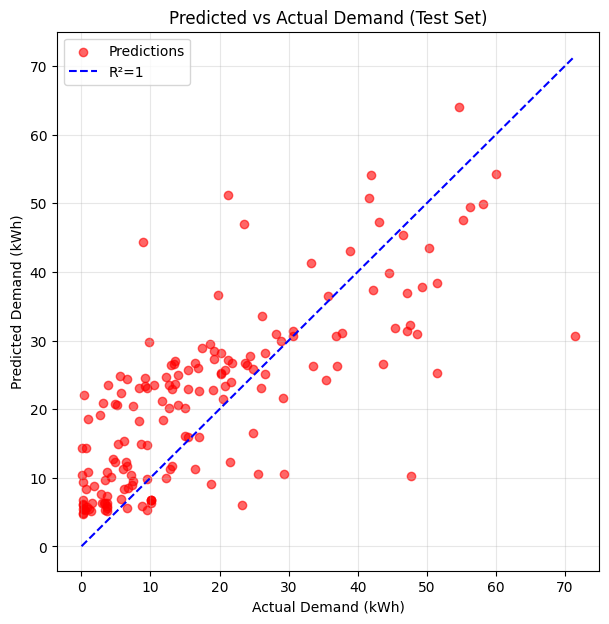

In [308]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import RobustScaler
from sklearn.metrics import r2_score
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GRU, Dense, Dropout

# -----------------------------
# 1️⃣ Prepare data
# -----------------------------
hourly_subset = hourly_df[hourly_df.index >= '2018-04-23'].copy()

# Remove outliers using IQR
Q1 = hourly_subset['kWh'].quantile(0.25)
Q3 = hourly_subset['kWh'].quantile(0.75)
IQR = Q3 - Q1
hourly_subset = hourly_subset[(hourly_subset['kWh'] >= Q1 - 1.5*IQR) &
                              (hourly_subset['kWh'] <= Q3 + 1.5*IQR)]

# Time features
hourly_subset['Hour'] = hourly_subset.index.hour
hourly_subset['DayOfWeek'] = hourly_subset.index.dayofweek

# Lag features
hourly_subset['lag_1'] = hourly_subset['kWh'].shift(1).fillna(method='bfill')
hourly_subset['lag_24'] = hourly_subset['kWh'].shift(24).fillna(method='bfill')  # previous day same hour
hourly_subset['rolling_24'] = hourly_subset['kWh'].rolling(24, min_periods=1).mean()

features = ['Hour', 'DayOfWeek', 'lag_1', 'lag_24', 'rolling_24']
target = 'kWh'

# -----------------------------
# 2️⃣ Train/Val/Test Split
# -----------------------------
train_df = hourly_subset[hourly_subset.index <= '2018-10-31']
val_df   = hourly_subset[(hourly_subset.index >= '2018-11-01') & (hourly_subset.index <= '2018-12-31')]
test_df  = hourly_subset[(hourly_subset.index >= '2019-01-01') & (hourly_subset.index <= '2019-01-31')]

# -----------------------------
# 3️⃣ Scaling
# -----------------------------
feature_scaler = RobustScaler()
X_train_scaled = feature_scaler.fit_transform(train_df[features])
X_val_scaled   = feature_scaler.transform(val_df[features])
X_test_scaled  = feature_scaler.transform(test_df[features])

target_scaler = RobustScaler()
y_train_scaled = target_scaler.fit_transform(train_df[[target]])
y_val_scaled   = target_scaler.transform(val_df[[target]])
y_test_scaled  = target_scaler.transform(test_df[[target]])

# -----------------------------
# 4️⃣ Create sequences
# -----------------------------
def create_sequences(X, y, seq_length=168):
    X_seq, y_seq = [], []
    for i in range(seq_length, len(X)):
        X_seq.append(X[i-seq_length:i, :])
        y_seq.append(y[i, 0])
    return np.array(X_seq), np.array(y_seq)

seq_length = 168
X_train, y_train = create_sequences(X_train_scaled, y_train_scaled, seq_length)
X_val, y_val     = create_sequences(X_val_scaled, y_val_scaled, seq_length)
X_test, y_test   = create_sequences(X_test_scaled, y_test_scaled, seq_length)

# -----------------------------
# 5️⃣ Build GRU model
# -----------------------------
model = Sequential([
    GRU(64, return_sequences=True, input_shape=(seq_length, X_train.shape[2])),
    Dropout(0.2),
    GRU(32),
    Dropout(0.2),
    Dense(32, activation='relu'),
    Dense(1)
])

model.compile(optimizer=tf.keras.optimizers.Adam(0.001), loss='mae')

# -----------------------------
# 6️⃣ Train
# -----------------------------
history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=50,
    batch_size=64,
    verbose=2
)

# -----------------------------
# 7️⃣ Predictions & Inverse scaling
# -----------------------------
train_pred = model.predict(X_train)
val_pred   = model.predict(X_val)
test_pred  = model.predict(X_test)

# Inverse scale
y_train_inv = target_scaler.inverse_transform(y_train.reshape(-1,1))
train_pred_inv = target_scaler.inverse_transform(train_pred)

y_val_inv = target_scaler.inverse_transform(y_val.reshape(-1,1))
val_pred_inv = target_scaler.inverse_transform(val_pred)

y_test_inv = target_scaler.inverse_transform(y_test.reshape(-1,1))
test_pred_inv = target_scaler.inverse_transform(test_pred)

# -----------------------------
# 8️⃣ Metrics
# -----------------------------
def compute_metrics(y_true, y_pred):
    errors = y_pred.flatten() - y_true.flatten()
    ME   = np.mean(errors)
    MAE  = np.mean(np.abs(errors))
    RMSE = np.sqrt(np.mean(errors**2))
    SMAPE = np.mean(2 * np.abs(errors) / (np.abs(y_pred.flatten()) + np.abs(y_true.flatten()))) * 100
    R2 = r2_score(y_true, y_pred)
    return ME, MAE, RMSE, SMAPE, R2

sets = {'Train': (y_train_inv, train_pred_inv),
        'Validation': (y_val_inv, val_pred_inv),
        'Test': (y_test_inv, test_pred_inv)}

print("Metrics:")
for name, (y_true, y_pred) in sets.items():
    ME, MAE, RMSE, SMAPE, R2 = compute_metrics(y_true, y_pred)
    print(f"{name}: ME={ME:.2f}, MAE={MAE:.2f}, RMSE={RMSE:.2f}, SMAPE={SMAPE:.2f}%, R²={R2:.3f}")

# -----------------------------
# 9️⃣ Parity plot (Predicted vs Actual) for test set
# -----------------------------
plt.figure(figsize=(7,7))
plt.scatter(y_test_inv, test_pred_inv, alpha=0.6, color='red', label='Predictions')
plt.plot([y_test_inv.min(), y_test_inv.max()],
         [y_test_inv.min(), y_test_inv.max()],
         color='blue', linestyle='--', label='R²=1')
plt.xlabel("Actual Demand (kWh)")
plt.ylabel("Predicted Demand (kWh)")
plt.title("Predicted vs Actual Demand (Test Set)")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

R² = 0.5327


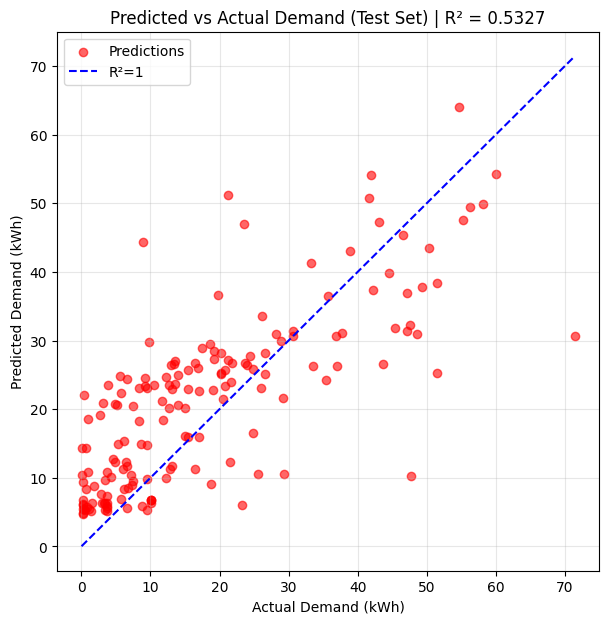

In [309]:
from sklearn.metrics import r2_score

# Compute R²
r2 = r2_score(y_test_inv, test_pred_inv)
print(f"R² = {r2:.4f}")

# -----------------------------
# Parity plot
# -----------------------------
plt.figure(figsize=(7,7))
plt.scatter(y_test_inv, test_pred_inv, alpha=0.6, color='red', label='Predictions')
plt.plot([y_test_inv.min(), y_test_inv.max()],
         [y_test_inv.min(), y_test_inv.max()],
         color='blue', linestyle='--', label='R²=1')
plt.xlabel("Actual Demand (kWh)")
plt.ylabel("Predicted Demand (kWh)")
plt.title(f"Predicted vs Actual Demand (Test Set) | R² = {r2:.4f}")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

Performance metrics for the configurations

In [310]:
import numpy as np

# y_test_inv → actual
# test_pred_inv → predicted

errors = test_pred_inv.flatten() - y_test_inv.flatten()

ME   = np.mean(errors)
MAE  = np.mean(np.abs(errors))
RMSE = np.sqrt(np.mean(errors**2))
MAPE = np.mean(np.abs(errors / y_test_inv.flatten())) * 100  # in %

print(f"Mean Error (ME): {ME:.3f} kWh")
print(f"Mean Absolute Error (MAE): {MAE:.3f} kWh")
print(f"Root Mean Squared Error (RMSE): {RMSE:.3f} kWh")
print(f"Mean Absolute Percentage Error (MAPE): {MAPE:.2f}%")

Mean Error (ME): 3.304 kWh
Mean Absolute Error (MAE): 8.491 kWh
Root Mean Squared Error (RMSE): 10.970 kWh
Mean Absolute Percentage Error (MAPE): 608.48%


# Plot train / validation / test split

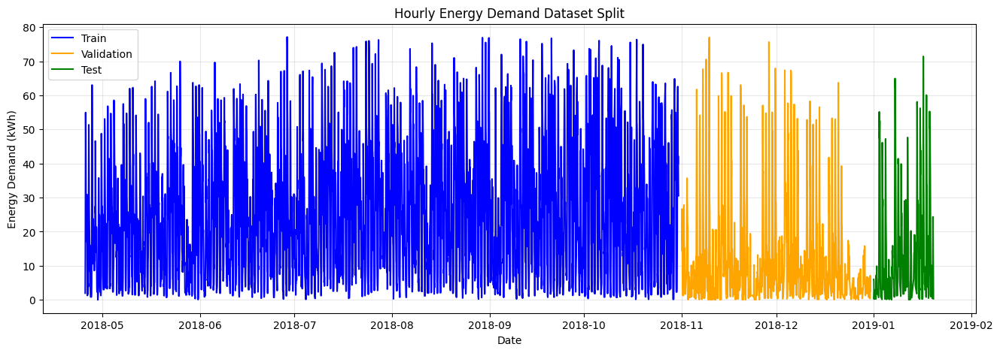

In [312]:
# -----------------------------
# Plot train / validation / test split
# -----------------------------
plt.figure(figsize=(16,5))

plt.plot(train_df.index, train_df['kWh'], label='Train', color='blue')
plt.plot(val_df.index, val_df['kWh'], label='Validation', color='orange')
plt.plot(test_df.index, test_df['kWh'], label='Test', color='green')

plt.title("Hourly Energy Demand Dataset Split")
plt.xlabel("Date")
plt.ylabel("Energy Demand (kWh)")
plt.legend()
plt.grid(alpha=0.3)

plt.show()

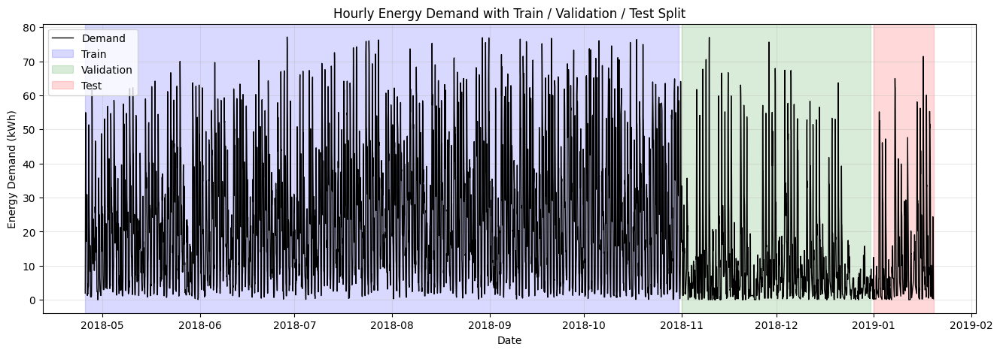

In [313]:
plt.figure(figsize=(16,5))

# Plot full demand curve
plt.plot(hourly_subset.index, hourly_subset['kWh'], color='black', linewidth=1, label='Demand')

# Shade regions
plt.axvspan(train_df.index.min(), train_df.index.max(),
            color='blue', alpha=0.15, label='Train')

plt.axvspan(val_df.index.min(), val_df.index.max(),
            color='green', alpha=0.15, label='Validation')

plt.axvspan(test_df.index.min(), test_df.index.max(),
            color='red', alpha=0.15, label='Test')

plt.title("Hourly Energy Demand with Train / Validation / Test Split")
plt.xlabel("Date")
plt.ylabel("Energy Demand (kWh)")
plt.legend()
plt.grid(alpha=0.3)

plt.show()

Plot to verify scaling: Powert​=fleet_size×ev_profilet​, Powert​=Fleet×EV_Energy×Profilet​

In [52]:
profile = hourly_subset['kWh']

normalized_profile = profile / profile.sum()

In [53]:
ev_annual_energy = 5600

In [54]:
ev_hourly_profile = normalized_profile * ev_annual_energy

In [55]:
fleet_size = 1

fleet_profile = ev_hourly_profile * fleet_size

In [56]:
print("Energy per EV:", ev_hourly_profile.sum())
print("Energy fleet:", fleet_profile.sum())

Energy per EV: 5600.0
Energy fleet: 5600.0


In [57]:
Power_profile = fleet_size * ev_hourly_profile

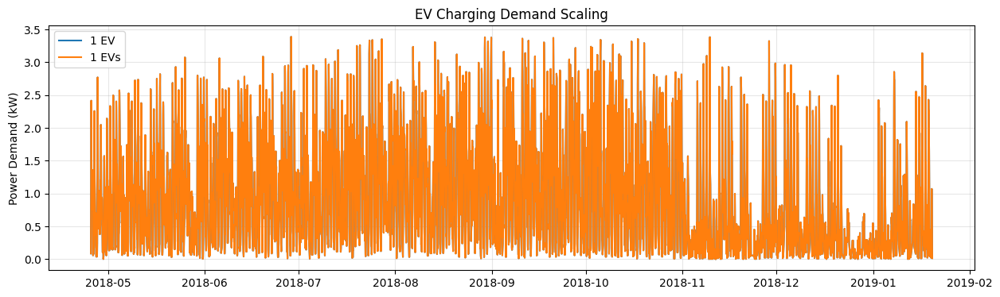

In [58]:
plt.figure(figsize=(15,4))

plt.plot(ev_hourly_profile.index, ev_hourly_profile,
         label="1 EV")

plt.plot(fleet_profile.index, fleet_profile,
         label=f"{fleet_size} EVs")

plt.legend()
plt.ylabel("Power Demand (kW)")
plt.title("EV Charging Demand Scaling")
plt.grid(alpha=0.3)
plt.show()

## Clustering-based scenario

Step 0 — Your existing preprocessing (cleaned)

In [59]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Convert to DataFrame
hourly_df = hourly_energy_series.to_frame(name="kWh")

# Add week number
hourly_df['week_of_year'] = hourly_df.index.isocalendar().week

# Keep week 17 onwards
hourly_subset = hourly_df[hourly_df['week_of_year'] >= 17].copy()

# Ensure sorted
hourly_subset = hourly_subset.sort_index()

Step 1 — Build daily profiles (24h per day)

In [60]:
# Ensure hourly resolution
hourly_series = hourly_subset['kWh'].resample('h').sum()

df = hourly_series.to_frame(name='kWh')
df['date'] = df.index.date
df['hour'] = df.index.hour

# Pivot: rows = days, columns = 24 hours
daily_profiles = df.pivot_table(index='date', columns='hour', values='kWh', aggfunc='sum')

# Keep only full days (24 hours)
daily_profiles = daily_profiles.dropna()

print("Daily profiles:", daily_profiles.shape)

Daily profiles: (249, 24)


Step 2 — Normalize

In [61]:
daily_totals = daily_profiles.sum(axis=1)

daily_profiles_norm = daily_profiles.div(daily_totals, axis=0).fillna(0)

Step 3 — Clustering

In [62]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score, silhouette_samples

scaler = StandardScaler()
X_scaled = scaler.fit_transform(daily_profiles_norm)

k = 3  # try 3–5
kmeans = KMeans(n_clusters=k, random_state=42, n_init=20)
clusters = kmeans.fit_predict(X_scaled)

daily_profiles_norm['cluster'] = clusters

c:\Users\betsie_0410\energiapy\.conda\lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


In [63]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score

scaler = StandardScaler()
X_scaled = scaler.fit_transform(daily_profiles_norm.drop(columns=['cluster', 'silhouette'], errors='ignore'))

for k in range(2, 17):
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=20)
    clusters = kmeans.fit_predict(X_scaled)
    score = silhouette_score(X_scaled, clusters)
    print(f"k={k}, silhouette score={score:.4f}")

c:\Users\betsie_0410\energiapy\.conda\lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\betsie_0410\energiapy\.conda\lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\betsie_0410\energiapy\.conda\lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\betsie_0410\energiapy\.conda\lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarn

k=2, silhouette score=0.2795
k=3, silhouette score=0.2652
k=4, silhouette score=0.2266
k=5, silhouette score=0.2313
k=6, silhouette score=0.2339
k=7, silhouette score=0.2379


c:\Users\betsie_0410\energiapy\.conda\lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\betsie_0410\energiapy\.conda\lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\betsie_0410\energiapy\.conda\lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\betsie_0410\energiapy\.conda\lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarn

k=8, silhouette score=0.1220
k=9, silhouette score=0.1309
k=10, silhouette score=0.1074
k=11, silhouette score=0.1112
k=12, silhouette score=0.1310


c:\Users\betsie_0410\energiapy\.conda\lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\betsie_0410\energiapy\.conda\lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\betsie_0410\energiapy\.conda\lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\betsie_0410\energiapy\.conda\lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarn

k=13, silhouette score=0.1066
k=14, silhouette score=0.1178
k=15, silhouette score=0.1121
k=16, silhouette score=0.1023


c:\Users\betsie_0410\energiapy\.conda\lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\betsie_0410\energiapy\.conda\lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\betsie_0410\energiapy\.conda\lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\betsie_0410\energiapy\.conda\lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarn

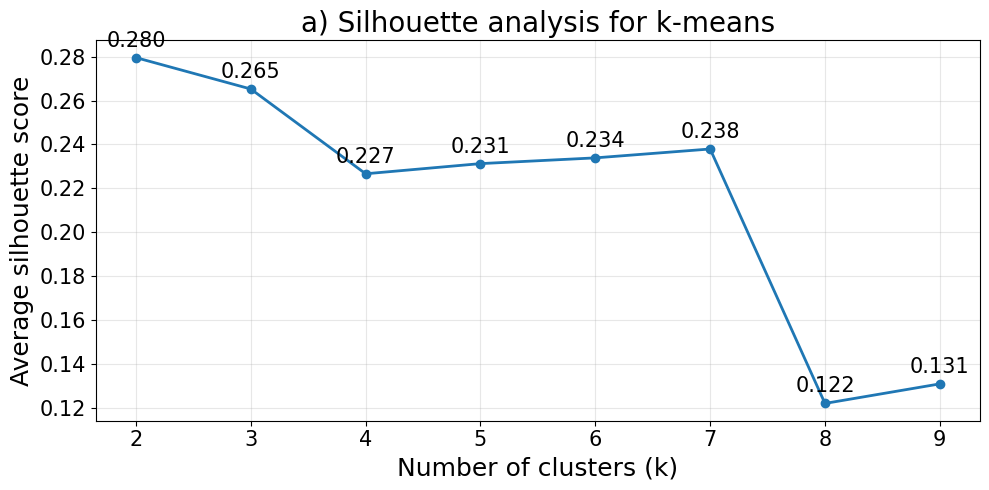

Best k = 2
Best silhouette score = 0.2795


In [64]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score

# -----------------------------
# Prepare numeric features only
# -----------------------------
X = daily_profiles_norm.select_dtypes(include='number').drop(
    columns=['cluster', 'silhouette'],
    errors='ignore'
)

# -----------------------------
# Test multiple k values
# -----------------------------
k_values = range(2, 10)
scores = []

for k in k_values:
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    kmeans = KMeans(n_clusters=k, random_state=42, n_init=20)
    labels = kmeans.fit_predict(X_scaled)

    score = silhouette_score(X_scaled, labels)
    scores.append(score)

# -----------------------------
# Plot silhouette scores
# -----------------------------
plt.figure(figsize=(10,5))
plt.plot(k_values, scores, marker='o', linewidth=2)

# Bigger axis numbers
plt.xticks(k_values, fontsize=15)
plt.yticks(fontsize=15)

plt.xlabel("Number of clusters (k)", fontsize=18)
plt.ylabel("Average silhouette score", fontsize=18)
plt.title("a) Silhouette analysis for k-means", fontsize=20)

plt.grid(alpha=0.3)

# Bigger annotations
for k, s in zip(k_values, scores):
    plt.text(k, s + 0.005, f"{s:.3f}", ha='center', fontsize=15)

plt.tight_layout()
plt.show()

# -----------------------------
# Best k
# -----------------------------
best_k = k_values[np.argmax(scores)]
best_score = max(scores)

print(f"Best k = {best_k}")
print(f"Best silhouette score = {best_score:.4f}")

Step 4 — Representative charging profiles

In [65]:
profile_cols = [c for c in daily_profiles_norm.columns if c != 'cluster']

representative_profiles = daily_profiles_norm.groupby('cluster')[profile_cols].mean()

print(representative_profiles)

hour           0         1         2         3         4         5         6   \
cluster                                                                         
0        0.041371  0.039501  0.046661  0.045591  0.035632  0.021644  0.013171   
1        0.068105  0.061355  0.061566  0.055260  0.047251  0.038277  0.032357   
2        0.018095  0.015846  0.025232  0.015042  0.020476  0.028317  0.048694   

hour           7         8         9   ...        14        15        16  \
cluster                                ...                                 
0        0.009151  0.007385  0.006179  ...  0.026451  0.058941  0.099259   
1        0.025693  0.020638  0.016371  ...  0.014902  0.025033  0.034981   
2        0.065371  0.085556  0.085845  ...  0.028853  0.034855  0.012478   

hour           17        18        19        20        21        22        23  
cluster                                                                        
0        0.110514  0.098722  0.080550  0.069759  0.06

Step 5 — Plot cluster shapes

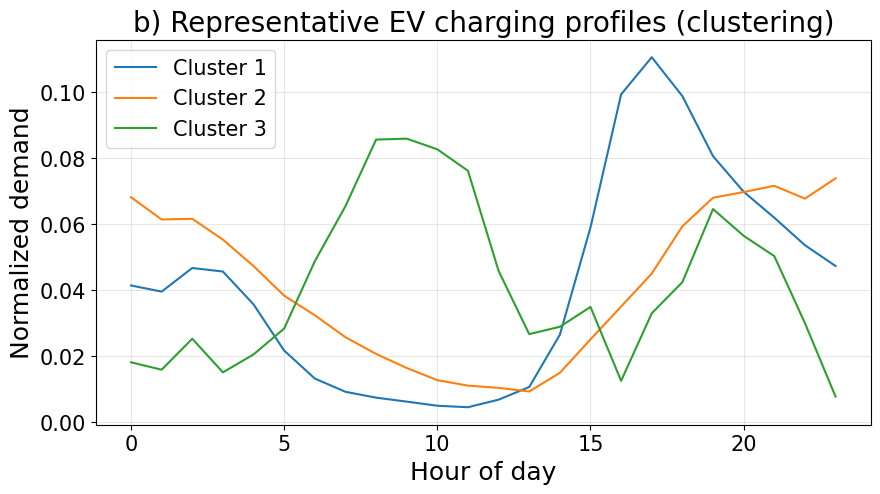

In [66]:
plt.figure(figsize=(10,5))

for c in representative_profiles.index:
    plt.plot(range(24), representative_profiles.loc[c], label=f'Cluster {c+1}')

plt.xlabel("Hour of day", fontsize=18)
plt.ylabel("Normalized demand", fontsize=18)
plt.title("b) Representative EV charging profiles (clustering)", fontsize=20)

# Bigger axis numbers
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

plt.legend(fontsize=15)
plt.grid(alpha=0.3)
plt.show()

Step 6 — Compute probabilities (weekday/weekend)

In [67]:
daily_profiles_norm.index = pd.to_datetime(daily_profiles_norm.index)
daily_profiles_norm['dow'] = daily_profiles_norm.index.dayofweek

weekday_probs = (
    daily_profiles_norm[daily_profiles_norm['dow'] < 5]['cluster']
    .value_counts(normalize=True).sort_index()
)

weekend_probs = (
    daily_profiles_norm[daily_profiles_norm['dow'] >= 5]['cluster']
    .value_counts(normalize=True).sort_index()
)


weekday_probs.head()

cluster
0    0.920904
1    0.067797
2    0.011299
Name: proportion, dtype: float64

Step 7 — Generate ONE full-year (8760) scenario

In [68]:
def generate_year(representative_profiles, weekday_probs, weekend_probs,
                  start_date='2019-01-01'):

    dates = pd.date_range(start_date, periods=365, freq='D')
    sampled_clusters = []

    for d in dates:
        if d.dayofweek < 5:
            sampled_clusters.append(
                np.random.choice(weekday_probs.index, p=weekday_probs.values)
            )
        else:
            sampled_clusters.append(
                np.random.choice(weekend_probs.index, p=weekend_probs.values)
            )

    # Build year
    year_profiles = np.vstack([representative_profiles.loc[c].values for c in sampled_clusters])
    scenario_8760 = year_profiles.flatten()

    index = pd.date_range(f'{start_date} 00:00:00', periods=8760, freq='h')

    return pd.DataFrame({'kWh': scenario_8760}, index=index)

Step 8 — Scale to 1 EV (5.6 MWh/year)

In [69]:
representative_profiles.head()

hour,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
cluster,,,,,,,,,,,,,,,,,,,,,
0,0.041371,0.039501,0.046661,0.045591,0.035632,0.021644,0.013171,0.009151,0.007385,0.006179,...,0.026451,0.058941,0.099259,0.110514,0.098722,0.080550,0.069759,0.061894,0.053573,0.047265
1,0.068105,0.061355,0.061566,0.055260,0.047251,0.038277,0.032357,0.025693,0.020638,0.016371,...,0.014902,0.025033,0.034981,0.044977,0.059280,0.067945,0.069660,0.071569,0.067681,0.073804
2,0.018095,0.015846,0.025232,0.015042,0.020476,0.028317,0.048694,0.065371,0.085556,0.085845,...,0.028853,0.034855,0.012478,0.032934,0.042384,0.064521,0.056408,0.050271,0.029965,0.007713


In [70]:
scenario_df = generate_year(representative_profiles, weekday_probs, weekend_probs)

annual_ev_energy = 5600  # kWh/year per EV

scenario_df['kWh'] = scenario_df['kWh'] / scenario_df['kWh'].sum() * annual_ev_energy

print("Check total:", scenario_df['kWh'].sum())

Check total: 5600.0


Step 9 — Scale to fleet

In [71]:
fleet_size = 1
scenario_df['fleet_kWh'] = scenario_df['kWh'] * fleet_size

Step 10 — Generate multiple stochastic scenarios

In [72]:
scenarios = {}

for s in range(5):
    df_s = generate_year(representative_profiles, weekday_probs, weekend_probs)
    df_s['kWh'] = df_s['kWh'] / df_s['kWh'].sum() * 5600
    scenarios[f'scenario_{s+1}'] = df_s

Plot multiple full-year scenarios

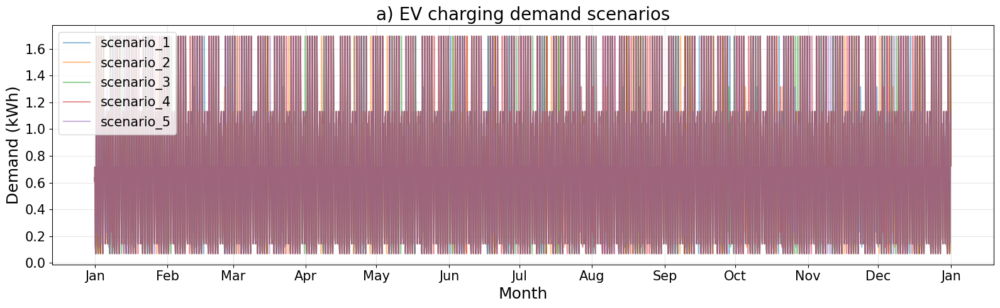

In [73]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

plt.figure(figsize=(16,5))

for name, df_s in scenarios.items():
    plt.plot(df_s.index, df_s['kWh'], alpha=0.5, label=name)

plt.title("a) EV charging demand scenarios", fontsize=20)
plt.xlabel("Month", fontsize=18)
plt.ylabel("Demand (kWh)", fontsize=18)

# Show months only
ax = plt.gca()
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b'))

# Bigger axis numbers
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

plt.legend(fontsize=15)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

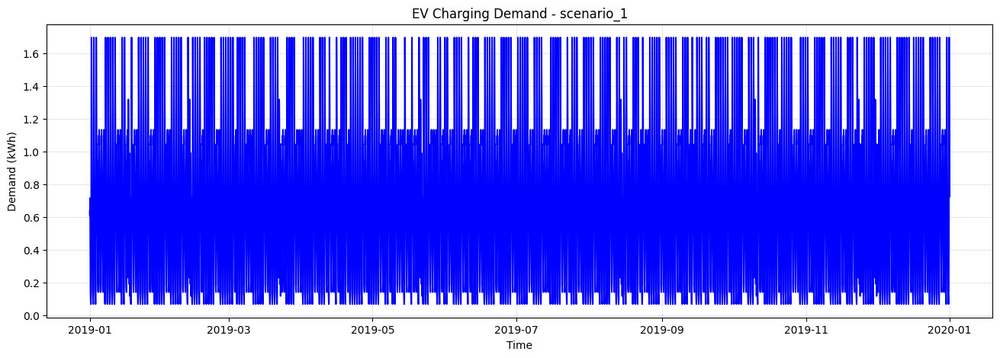

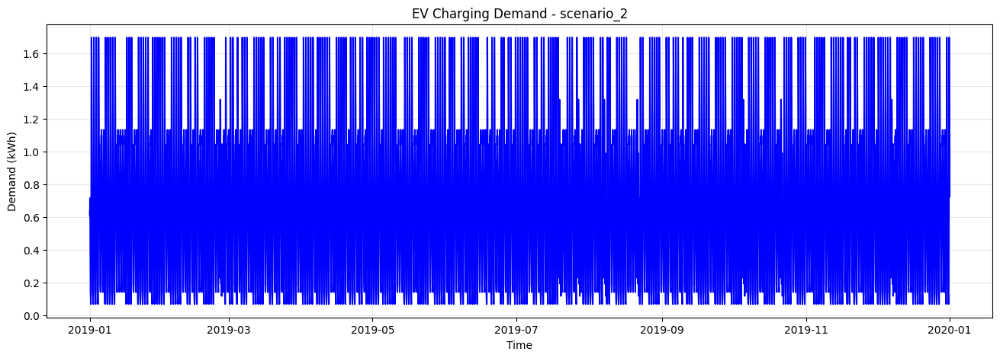

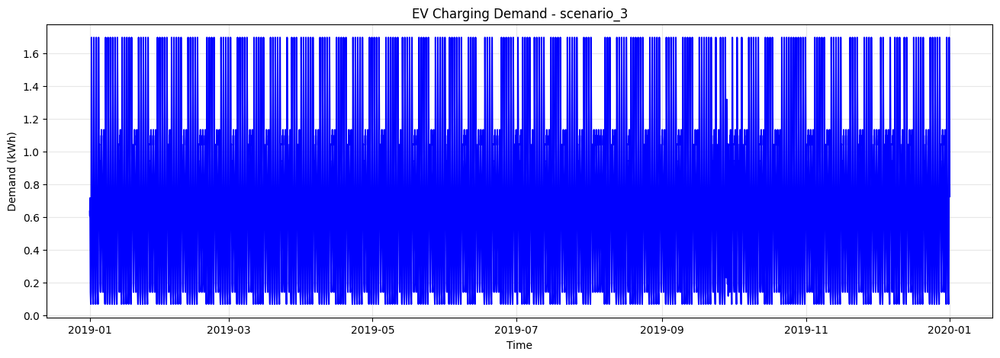

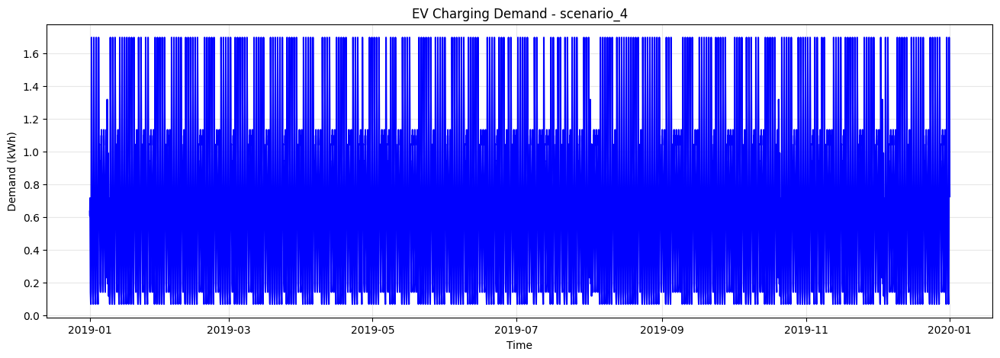

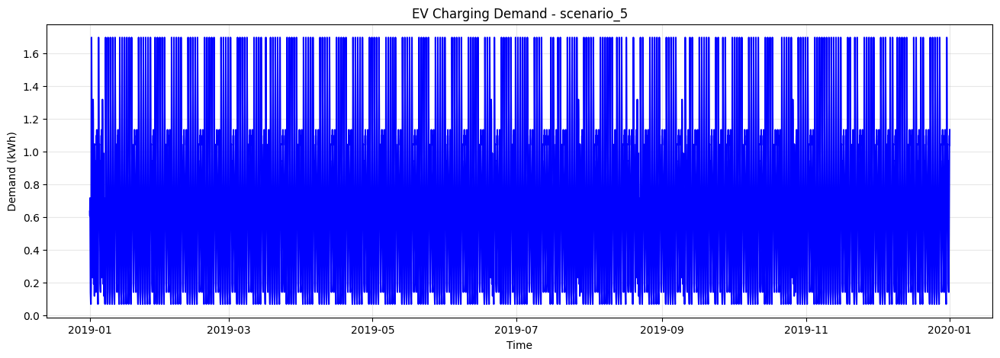

In [74]:
for name, df_s in scenarios.items():
    plt.figure(figsize=(16,5))

    plt.plot(df_s.index, df_s['kWh'], color='blue')

    plt.title(f"EV Charging Demand - {name}")
    plt.xlabel("Time")
    plt.ylabel("Demand (kWh)")
    plt.grid(alpha=0.3)

    plt.show()

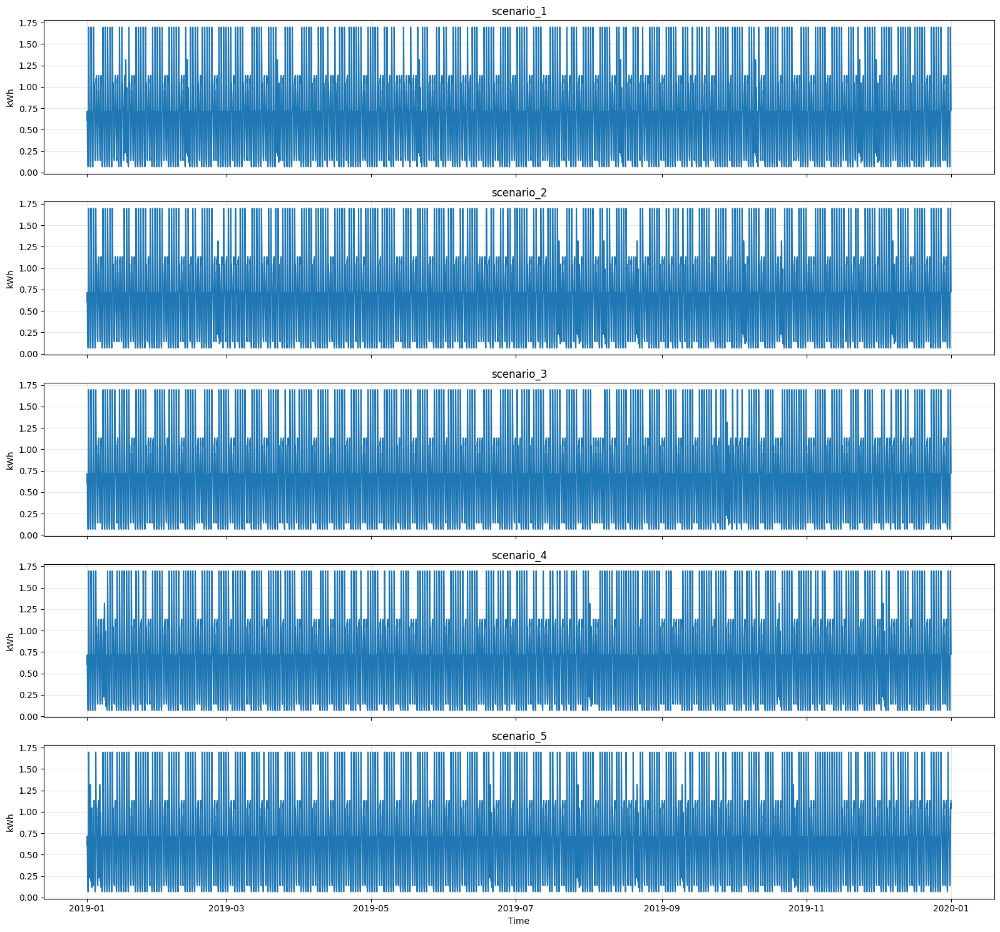

In [75]:
n = len(scenarios)

fig, axes = plt.subplots(n, 1, figsize=(16, 3*n), sharex=True)

for ax, (name, df_s) in zip(axes, scenarios.items()):
    ax.plot(df_s.index, df_s['kWh'])
    ax.set_title(name)
    ax.set_ylabel("kWh")
    ax.grid(alpha=0.3)

axes[-1].set_xlabel("Time")

plt.tight_layout()
plt.show()

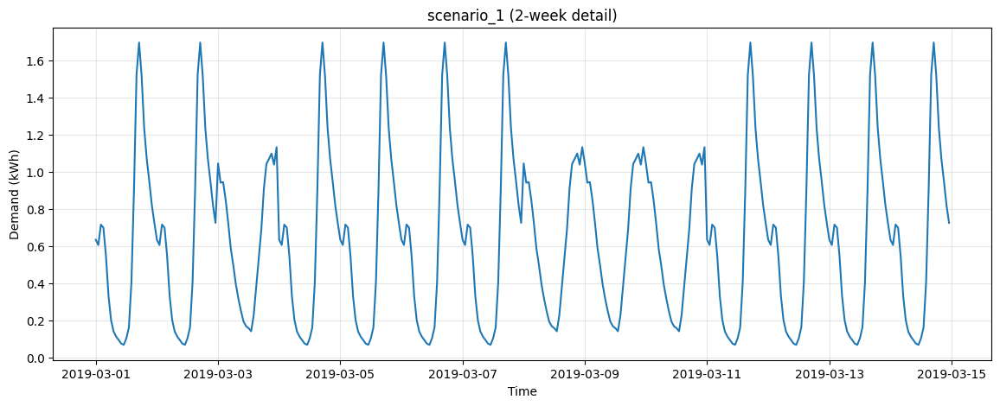

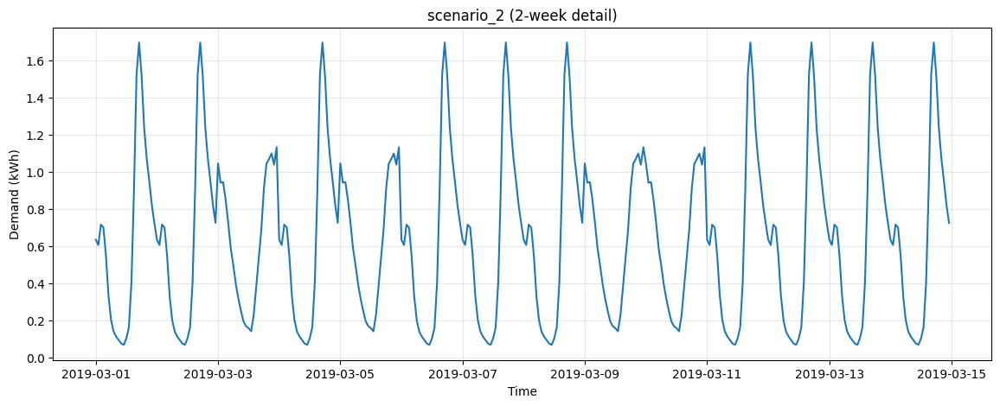

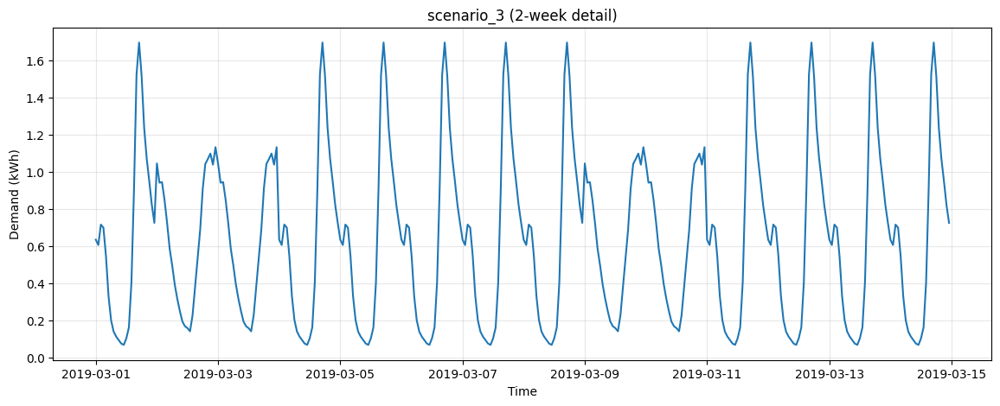

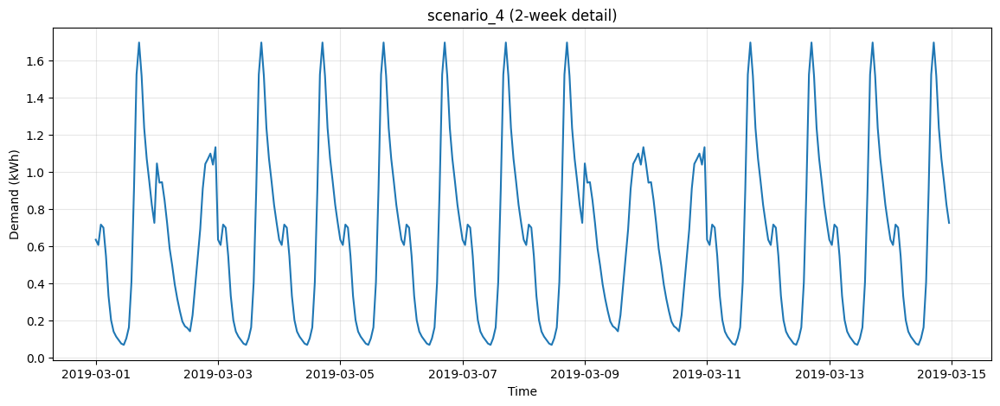

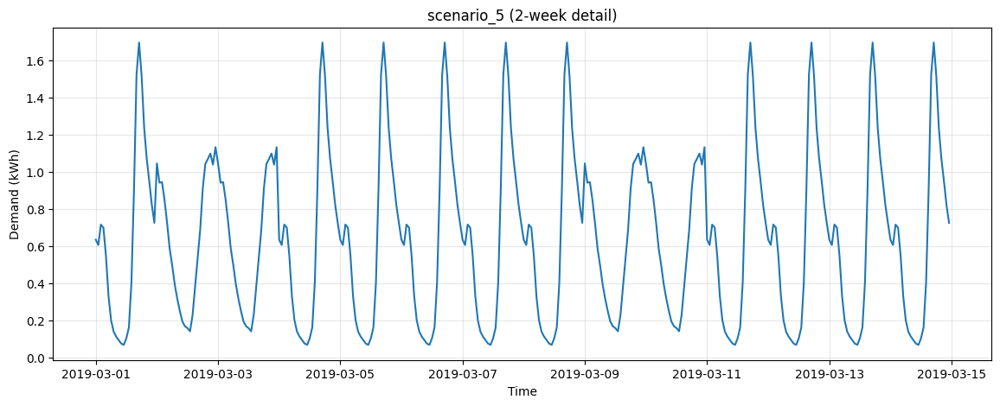

In [76]:
start = '2019-03-01'
end = '2019-03-14'

for name, df_s in scenarios.items():
    plt.figure(figsize=(14,5))

    plt.plot(df_s.loc[start:end].index,
             df_s.loc[start:end]['kWh'])

    plt.title(f"{name} (2-week detail)")
    plt.xlabel("Time")
    plt.ylabel("Demand (kWh)")
    plt.grid(alpha=0.3)

    plt.show()

Better version (no clutter, cleaner for paper)

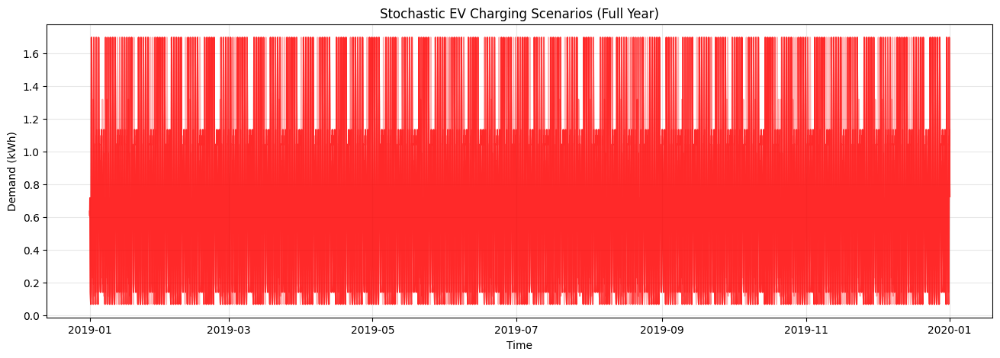

In [77]:
plt.figure(figsize=(16,5))

for df_s in scenarios.values():
    plt.plot(df_s.index, df_s['kWh'], color='red', alpha=0.3)

plt.title("Stochastic EV Charging Scenarios (Full Year)")
plt.xlabel("Time")
plt.ylabel("Demand (kWh)")
plt.grid(alpha=0.3)
plt.show()

Show mean + variability band (BEST for paper)

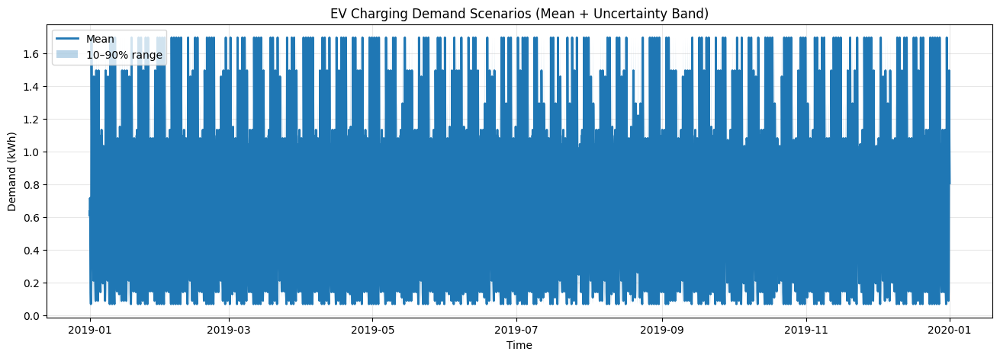

In [78]:
# Stack all scenarios
all_data = np.array([df_s['kWh'].values for df_s in scenarios.values()])

mean_profile = all_data.mean(axis=0)
p10 = np.percentile(all_data, 10, axis=0)
p90 = np.percentile(all_data, 90, axis=0)

plt.figure(figsize=(16,5))

plt.plot(scenarios[list(scenarios.keys())[0]].index, mean_profile, label='Mean', linewidth=2)
plt.fill_between(
    scenarios[list(scenarios.keys())[0]].index,
    p10, p90,
    alpha=0.3,
    label='10–90% range'
)

plt.title("EV Charging Demand Scenarios (Mean + Uncertainty Band)")
plt.xlabel("Time")
plt.ylabel("Demand (kWh)")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

Show mean + variability band (BEST for paper)

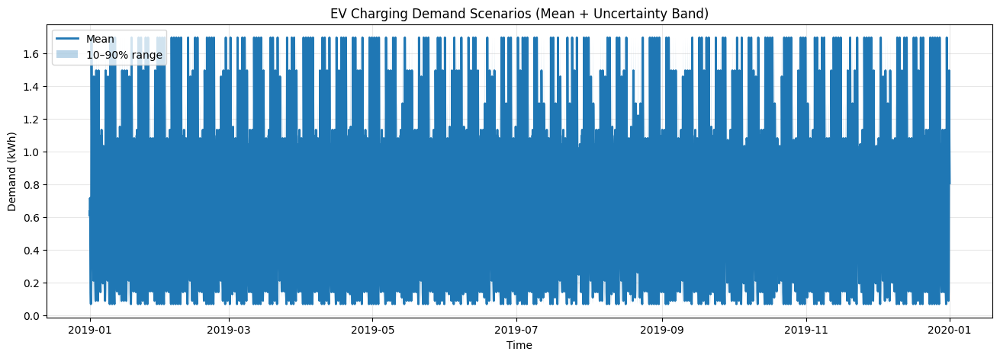

In [79]:
# Stack all scenarios
all_data = np.array([df_s['kWh'].values for df_s in scenarios.values()])

mean_profile = all_data.mean(axis=0)
p10 = np.percentile(all_data, 10, axis=0)
p90 = np.percentile(all_data, 90, axis=0)

plt.figure(figsize=(16,5))

plt.plot(scenarios[list(scenarios.keys())[0]].index, mean_profile, label='Mean', linewidth=2)
plt.fill_between(
    scenarios[list(scenarios.keys())[0]].index,
    p10, p90,
    alpha=0.3,
    label='10–90% range'
)

plt.title("EV Charging Demand Scenarios (Mean + Uncertainty Band)")
plt.xlabel("Time")
plt.ylabel("Demand (kWh)")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

Zoom into a few days (VERY important)

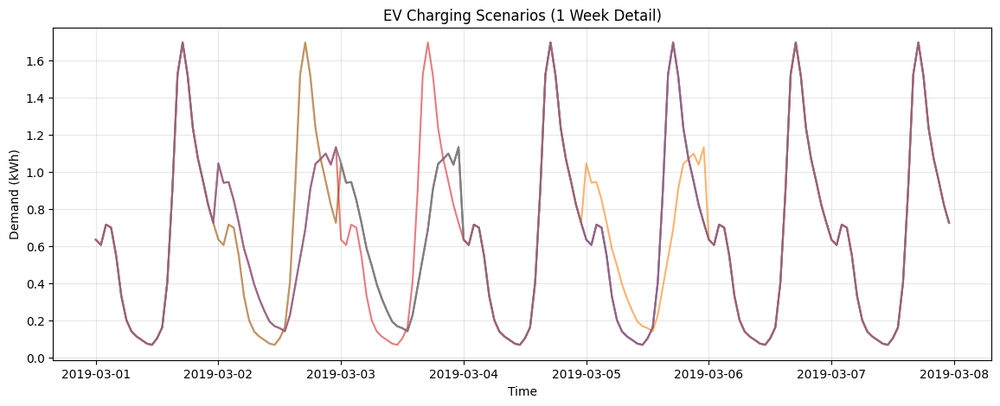

In [80]:
start = '2019-03-01'
end = '2019-03-07'

plt.figure(figsize=(14,5))

for df_s in scenarios.values():
    plt.plot(df_s.loc[start:end].index,
             df_s.loc[start:end]['kWh'],
             alpha=0.6)

plt.title("EV Charging Scenarios (1 Week Detail)")
plt.xlabel("Time")
plt.ylabel("Demand (kWh)")
plt.grid(alpha=0.3)
plt.show()

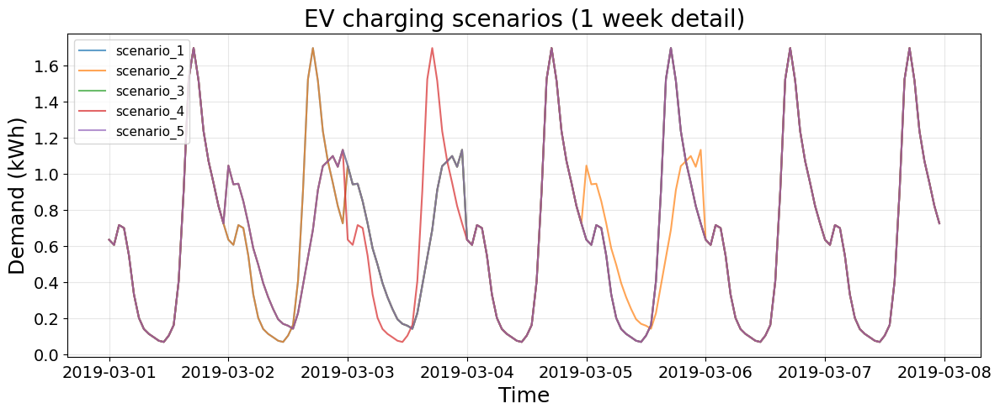

In [81]:
plt.figure(figsize=(14,5))

for name, df_s in scenarios.items():
    plt.plot(df_s.loc[start:end].index,
             df_s.loc[start:end]['kWh'],
             alpha=0.7,
             label=name)

plt.title("EV charging scenarios (1 week detail)", fontsize=20)
plt.xlabel("Time", fontsize=18)
plt.ylabel("Demand (kWh)", fontsize=18)
plt.legend(fontsize=11)

# Bigger axis numbers
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.grid(alpha=0.3)
plt.show()

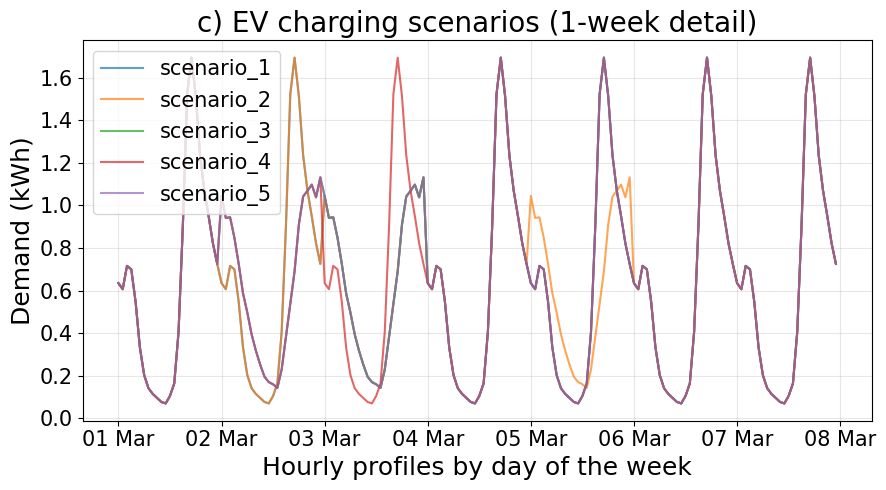

In [83]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

plt.figure(figsize=(9,5))

for name, df_s in scenarios.items():
    plt.plot(
        df_s.loc[start:end].index,
        df_s.loc[start:end]['kWh'],
        alpha=0.7,
        label=name
    )

plt.title("c) EV charging scenarios (1-week detail)", fontsize=20)
plt.xlabel("Hourly profiles by day of the week", fontsize=18)
plt.ylabel("Demand (kWh)", fontsize=18)

# Format x-axis as day + month (no year)
ax = plt.gca()
ax.xaxis.set_major_locator(mdates.DayLocator(interval=1))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%d %b'))

# Bigger axis numbers
plt.xticks(fontsize=15, rotation=0)
plt.yticks(fontsize=15)

plt.legend(fontsize=15)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

Compare vs constant load

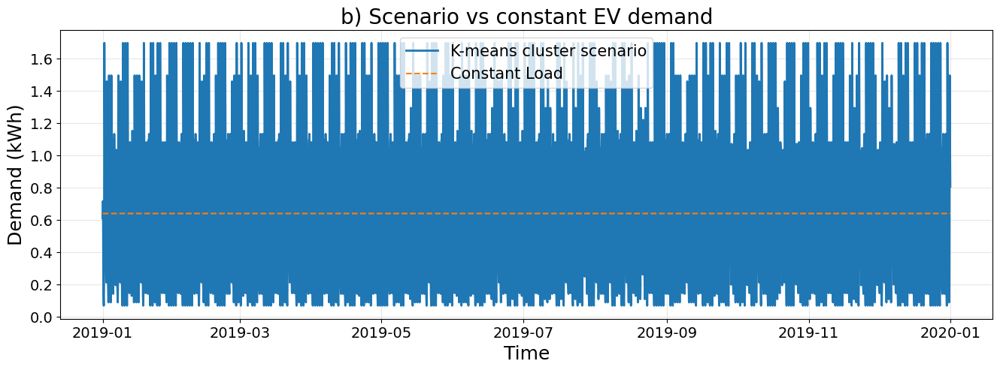

In [84]:
constant_load = np.ones_like(mean_profile) * mean_profile.mean()

plt.figure(figsize=(16,5))

plt.plot(scenarios[list(scenarios.keys())[0]].index,
         mean_profile, label='K-means cluster scenario', linewidth=2)

plt.plot(scenarios[list(scenarios.keys())[0]].index,
         constant_load, label='Constant Load', linestyle='--')

plt.title("b) Scenario vs constant EV demand", fontsize=20)
plt.xlabel("Time", fontsize=18)
plt.ylabel("Demand (kWh)", fontsize=18)

# Bigger axis numbers
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.legend(fontsize=15)
plt.grid(alpha=0.3)
plt.show()

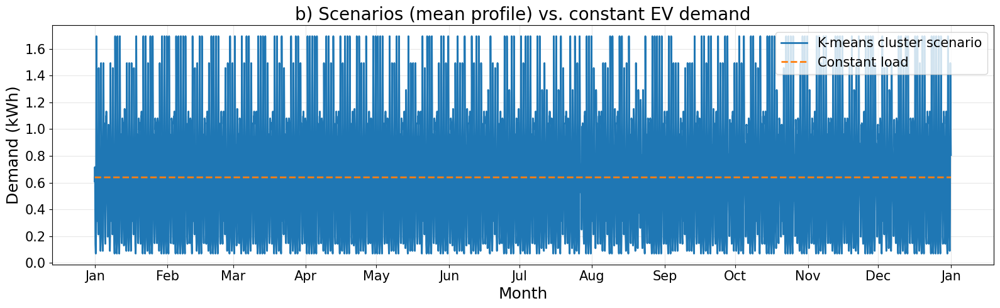

In [85]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np

constant_load = np.ones_like(mean_profile) * mean_profile.mean()

plt.figure(figsize=(16,5))

time_index = scenarios[list(scenarios.keys())[0]].index

plt.plot(
    time_index,
    mean_profile,
    label='K-means cluster scenario',
    linewidth=2
)

plt.plot(
    time_index,
    constant_load,
    label='Constant load',
    linestyle='--',
    linewidth=2
)

plt.title("b) Scenarios (mean profile) vs. constant EV demand", fontsize=20)
plt.xlabel("Month", fontsize=18)
plt.ylabel("Demand (kWh)", fontsize=18)

# Show months only
ax = plt.gca()
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b'))

# Bigger axis numbers
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

plt.legend(fontsize=15)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

Bonus: daily pattern visualization

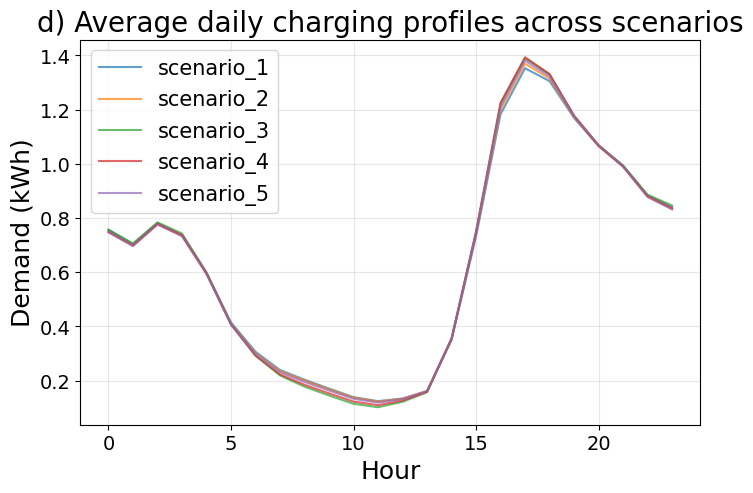

In [86]:
plt.figure(figsize=(8,5))

for name, df_s in scenarios.items():
    df_s['hour'] = df_s.index.hour
    avg_day = df_s.groupby('hour')['kWh'].mean()
    
    plt.plot(avg_day, alpha=0.7, label=name)

plt.title("d) Average daily charging profiles across scenarios", fontsize=20)
plt.xlabel("Hour", fontsize=18)
plt.ylabel("Demand (kWh)", fontsize=18)

# Bigger axis numbers
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.legend(fontsize=15)
plt.grid(alpha=0.3)
plt.show()

OPTION 1 — Export to JSON (BEST for code-to-code)
🔹 Save all scenarios into one JSON

In [89]:
ev_profiles = {}

for name, df_s in scenarios.items():
    prof = df_s['kWh'].copy()
    prof = prof / prof.sum()   # normalize
    ev_profiles[name] = prof

In [90]:
import json

scenarios_json = {}

for name, df_s in scenarios.items():
    scenarios_json[name] = {
        "time": df_s.index.strftime('%Y-%m-%d %H:%M:%S').tolist(),
        "kWh": df_s['kWh'].tolist()
    }

with open("ev_scenarios.json", "w") as f:
    json.dump(scenarios_json, f, indent=4)

### GMM

Full pipeline for your hourly dataframe

In [103]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler

# Ensure hourly resolution
hourly_series = hourly_subset['kWh'].resample('h').sum()

df = hourly_series.to_frame(name='kWh')
df['date'] = df.index.date
df['hour'] = df.index.hour

# Daily 24-hour matrix
daily_profiles = df.pivot_table(index='date', columns='hour', values='kWh', aggfunc='sum')

# Keep only complete days
daily_profiles = daily_profiles.dropna()

print("Daily profiles shape:", daily_profiles.shape)

Daily profiles shape: (249, 24)


2. Normalize each day by its daily total

In [104]:
daily_totals = daily_profiles.sum(axis=1)
daily_profiles_norm = daily_profiles.div(daily_totals, axis=0).fillna(0)

3. Standardize and fit GMM

In [105]:
X = daily_profiles_norm.values

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

n_components = 4  # try 3 to 5
gmm = GaussianMixture(
    n_components=n_components,
    covariance_type='full',
    random_state=42,
    n_init=10
)

gmm.fit(X_scaled)

# Hard label for each day
labels = gmm.predict(X_scaled)

# Soft probabilities for each day
membership_probs = gmm.predict_proba(X_scaled)

daily_profiles_norm = daily_profiles_norm.copy()
daily_profiles_norm['component'] = labels

c:\Users\betsie_0410\energiapy\.conda\lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\betsie_0410\energiapy\.conda\lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\betsie_0410\energiapy\.conda\lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\betsie_0410\energiapy\.conda\lib\site-packages\sklearn\cluster\_kmeans.py:1426: UserWarn

4. Representative profiles

In [107]:
profile_cols = list(range(24))  # columns 0..23
representative_profiles = daily_profiles_norm.groupby('component')[profile_cols].mean()

print(representative_profiles)

hour             0         1         2         3         4         5   \
component                                                               
0          0.022581  0.026035  0.034584  0.027790  0.031802  0.040178   
1          0.043342  0.046021  0.055122  0.052027  0.039372  0.023849   
2          0.075532  0.064651  0.064328  0.055767  0.047839  0.038673   
3          0.034642  0.019485  0.017614  0.025007  0.024928  0.017618   

hour             6         7         8         9   ...        14        15  \
component                                          ...                       
0          0.036684  0.050702  0.069388  0.069389  ...  0.031394  0.029801   
1          0.014746  0.010309  0.008860  0.007535  ...  0.029767  0.063824   
2          0.034121  0.026553  0.020163  0.015434  ...  0.013273  0.022129   
3          0.012604  0.009714  0.006548  0.005181  ...  0.011672  0.033849   

hour             16        17        18        19        20        21  \
component          

5. Component probabilities

In [108]:
component_probs = gmm.weights_
print("Component probabilities:", component_probs)
print("Check sum:", component_probs.sum())

Component probabilities: [0.02409639 0.58255062 0.23296669 0.1603863 ]
Check sum: 1.0


6. Plot representative GMM profiles

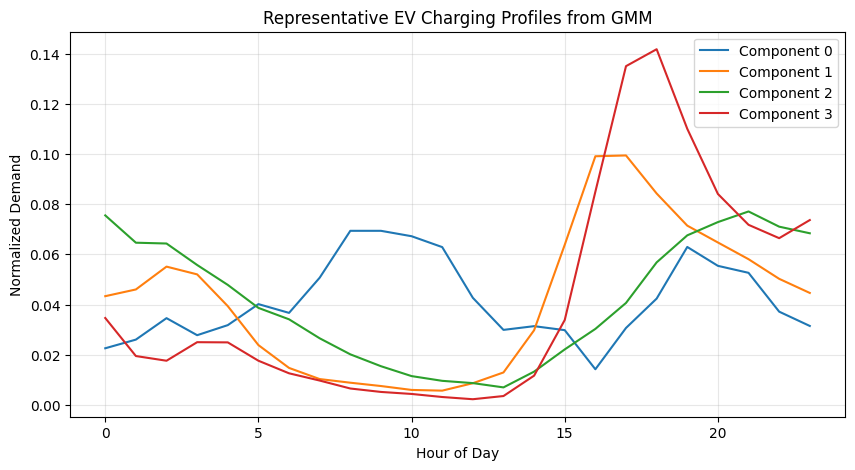

In [109]:
plt.figure(figsize=(10,5))

for c in representative_profiles.index:
    plt.plot(range(24), representative_profiles.loc[c], label=f'Component {c}')

plt.title("Representative EV Charging Profiles from GMM")
plt.xlabel("Hour of Day")
plt.ylabel("Normalized Demand")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

How to generate full-year GMM scenarios

In [110]:
def generate_gmm_year(representative_profiles, component_probs, start_date='2019-01-01'):
    dates = pd.date_range(start_date, periods=365, freq='D')

    sampled_components = np.random.choice(
        representative_profiles.index,
        size=len(dates),
        p=component_probs
    )

    year_profiles = np.vstack([
        representative_profiles.loc[c].values for c in sampled_components
    ])

    scenario_8760 = year_profiles.flatten()
    index = pd.date_range(f'{start_date} 00:00:00', periods=8760, freq='h')

    return pd.DataFrame({'kWh': scenario_8760}, index=index), sampled_components

Generate one year:

In [111]:
scenario_df, sampled_components = generate_gmm_year(representative_profiles, component_probs)

Option B: preserve weekday/weekend structure

Step 1: add weekday info

In [112]:
daily_profiles_norm.index = pd.to_datetime(daily_profiles_norm.index)
daily_profiles_norm['dow'] = daily_profiles_norm.index.dayofweek

Step 2: estimate weekday/weekend component probabilities

In [113]:
weekday_probs = (
    daily_profiles_norm[daily_profiles_norm['dow'] < 5]['component']
    .value_counts(normalize=True)
    .sort_index()
)

weekend_probs = (
    daily_profiles_norm[daily_profiles_norm['dow'] >= 5]['component']
    .value_counts(normalize=True)
    .sort_index()
)

# Make sure all components appear
weekday_probs = weekday_probs.reindex(representative_profiles.index, fill_value=0)
weekend_probs = weekend_probs.reindex(representative_profiles.index, fill_value=0)

weekday_probs = weekday_probs / weekday_probs.sum()
weekend_probs = weekend_probs / weekend_probs.sum()

Step 3: generate year

In [114]:
def generate_gmm_year_weektype(representative_profiles, weekday_probs, weekend_probs,
                               start_date='2019-01-01'):
    dates = pd.date_range(start_date, periods=365, freq='D')
    sampled_components = []

    for d in dates:
        if d.dayofweek < 5:
            sampled_components.append(
                np.random.choice(representative_profiles.index, p=weekday_probs.values)
            )
        else:
            sampled_components.append(
                np.random.choice(representative_profiles.index, p=weekend_probs.values)
            )

    year_profiles = np.vstack([
        representative_profiles.loc[c].values for c in sampled_components
    ])

    scenario_8760 = year_profiles.flatten()
    index = pd.date_range(f'{start_date} 00:00:00', periods=8760, freq='h')

    return pd.DataFrame({'kWh': scenario_8760}, index=index), sampled_components

Generate one year:

In [115]:
scenario_df, sampled_components = generate_gmm_year_weektype(
    representative_profiles,
    weekday_probs,
    weekend_probs
)

Scale to one EV

In [116]:
annual_ev_energy = 5600  # kWh/year per EV

scenario_df['kWh'] = scenario_df['kWh'] / scenario_df['kWh'].sum() * annual_ev_energy

print("Total annual energy:", scenario_df['kWh'].sum())

Total annual energy: 5599.999999999999


Scale to fleet size

In [117]:
fleet_size = 1
scenario_df['fleet_kWh'] = scenario_df['kWh'] * fleet_size

Generate multiple GMM scenarios

In [118]:
gmm_scenarios = {}

for s in range(5):
    df_s, sampled_components = generate_gmm_year_weektype(
        representative_profiles,
        weekday_probs,
        weekend_probs,
        start_date='2019-01-01'
    )
    df_s['kWh'] = df_s['kWh'] / df_s['kWh'].sum() * 5600
    gmm_scenarios[f"Scenario {s+1}"] = df_s

Plot the full-year scenarios

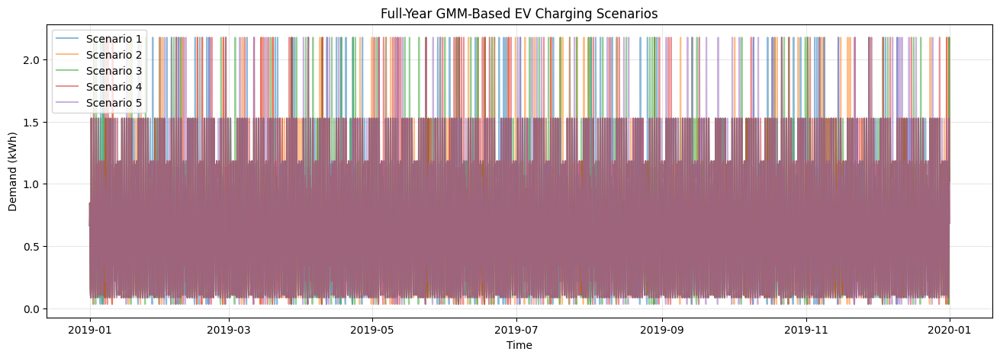

In [119]:
plt.figure(figsize=(16,5))

for name, df_s in gmm_scenarios.items():
    plt.plot(df_s.index, df_s['kWh'], alpha=0.5, label=name)

plt.title("Full-Year GMM-Based EV Charging Scenarios")
plt.xlabel("Time")
plt.ylabel("Demand (kWh)")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

Plot average daily profiles across scenarios

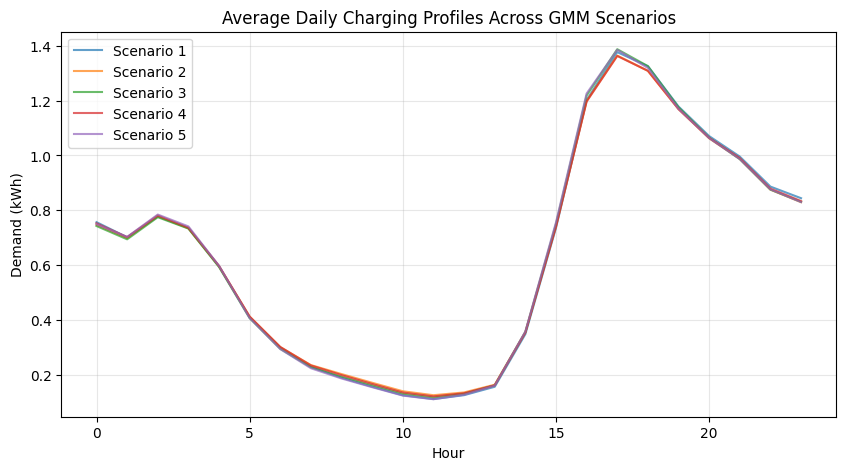

In [120]:
plt.figure(figsize=(10,5))

for name, df_s in gmm_scenarios.items():
    temp = df_s.copy()
    temp['hour'] = temp.index.hour
    avg_day = temp.groupby('hour')['kWh'].mean()
    plt.plot(avg_day, alpha=0.7, label=name)

plt.title("Average Daily Charging Profiles Across GMM Scenarios")
plt.xlabel("Hour")
plt.ylabel("Demand (kWh)")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

How to use ARIMA for scenario generation

In [121]:
from statsmodels.tsa.arima.model import ARIMA

log_series = np.log1p(hourly_subset['kWh'])  # log(1 + x)

model = ARIMA(log_series, order=(2,1,2))
model_fit = model.fit()

forecast_log = model_fit.forecast(steps=8760)

forecast = np.expm1(forecast_log)  # inverse transform

c:\Users\betsie_0410\energiapy\.conda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\betsie_0410\energiapy\.conda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\betsie_0410\energiapy\.conda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\betsie_0410\energiapy\.conda\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameter

Step 2 — Forecast

Step 3 — Add stochasticity

In [196]:
residuals = model_fit.resid

scenarios_arima = {}

for s in range(5):
    noise = np.random.choice(residuals, size=8760)
    scenarios_arima[f"Scenario_{s+1}"] = forecast + noise
    

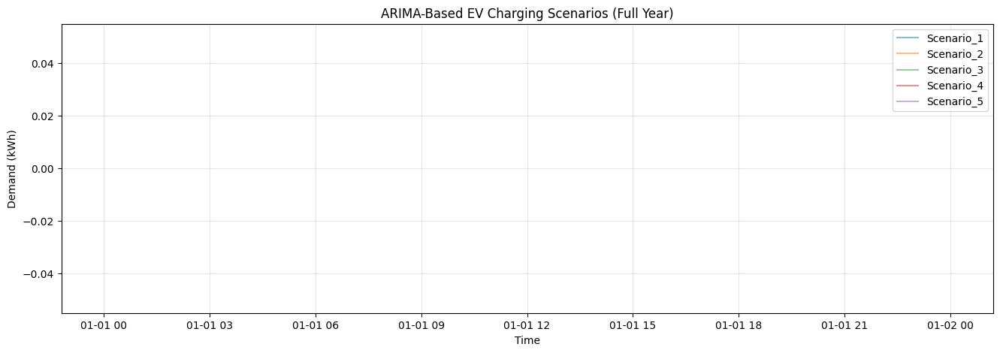

In [197]:
time_index = pd.date_range('2019-01-01 00:00:00', periods=8760, freq='h')

scenarios_arima = {}

for s in range(5):
    noise = np.random.choice(residuals, size=8760)
    scenario = forecast + noise
    scenario = np.clip(scenario, 0, None)

    scenarios_arima[f"Scenario_{s+1}"] = pd.Series(scenario, index=time_index)



plt.figure(figsize=(16,5))

for name, series in scenarios_arima.items():
    plt.plot(series.index, series.values, alpha=0.5, label=name)

plt.title("ARIMA-Based EV Charging Scenarios (Full Year)")
plt.xlabel("Time")
plt.ylabel("Demand (kWh)")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

In [198]:
kwh = np.ravel(hourly_subset['kWh'].values)

print((kwh < 0).any())
print((kwh < 0).sum())

False
0


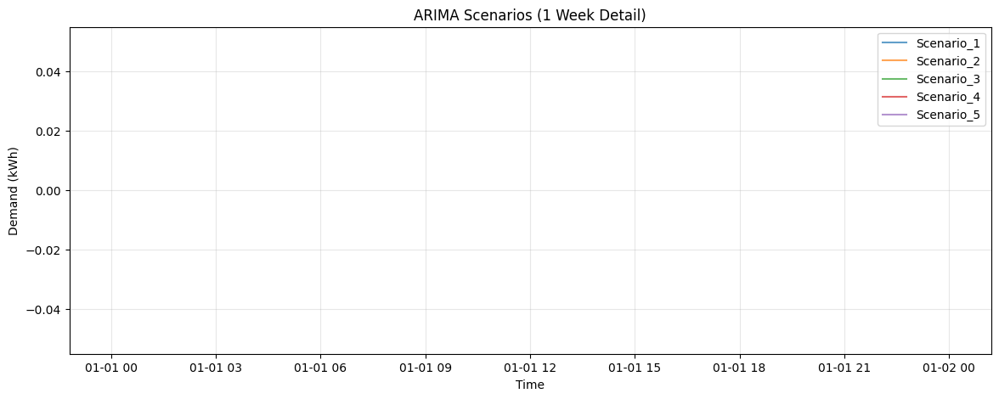

In [199]:
start = '2019-03-01'
end = '2019-03-07'

plt.figure(figsize=(14,5))

for name, series in scenarios_arima.items():
    plt.plot(series.loc[start:end].index,
             series.loc[start:end].values,
             alpha=0.7,
             label=name)

plt.title("ARIMA Scenarios (1 Week Detail)")
plt.xlabel("Time")
plt.ylabel("Demand (kWh)")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

Any negatives in original data? False
Number of negatives: 0


c:\Users\betsie_0410\energiapy\.conda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\betsie_0410\energiapy\.conda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\betsie_0410\energiapy\.conda\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
c:\Users\betsie_0410\energiapy\.conda\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameter

Residuals contain NaN? False
Forecast_log contain NaN? False
Scenario_1 NaN? False min= 0.0 max= 6.2096641014422 sum= 5600.000000000001
Scenario_2 NaN? False min= 0.0 max= 6.221353579644621 sum= 5599.999999999999
Scenario_3 NaN? False min= 0.0 max= 6.341049158483533 sum= 5600.000000000001
Scenario_4 NaN? False min= 0.0 max= 6.254626128376257 sum= 5600.000000000001
Scenario_5 NaN? False min= 0.0 max= 6.208195670706159 sum= 5600.0


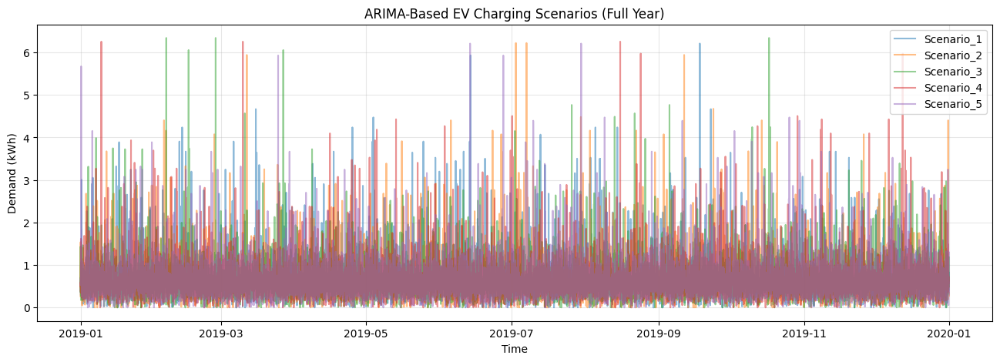

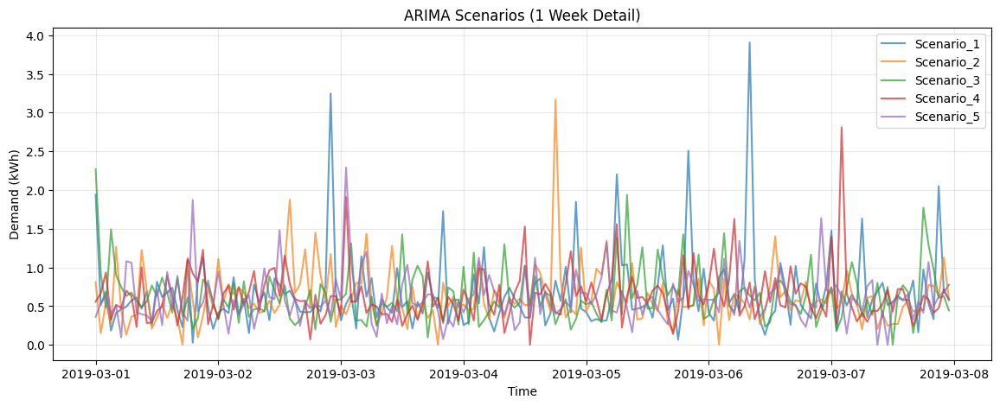

In [204]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA

# -----------------------------
# 1. Prepare series
# -----------------------------
kwh = np.ravel(hourly_subset['kWh'].values).astype(float)

# Optional safety check
print("Any negatives in original data?", (kwh < 0).any())
print("Number of negatives:", (kwh < 0).sum())

# Convert back to Series with datetime index
series = pd.Series(kwh, index=hourly_subset.index)

# -----------------------------
# 2. Log transform and fit ARIMA
# -----------------------------
log_series = np.log1p(series)

model = ARIMA(log_series, order=(2, 1, 2))
model_fit = model.fit()

# Forecast on log scale
forecast_log = model_fit.forecast(steps=8760)

# Clean residuals on log scale
residuals_log = pd.Series(model_fit.resid).dropna().values.astype(float)

print("Residuals contain NaN?", np.isnan(residuals_log).any())
print("Forecast_log contain NaN?", np.isnan(np.array(forecast_log)).any())

# -----------------------------
# 3. Generate ARIMA scenarios
# -----------------------------
time_index = pd.date_range('2019-01-01 00:00:00', periods=8760, freq='h')
forecast_log_vals = np.array(forecast_log, dtype=float)

scenarios_arima = {}

for s in range(5):
    # Sample noise on LOG scale
    noise_log = np.random.choice(residuals_log, size=8760, replace=True)

    scenario_log = forecast_log_vals + noise_log

    # Back-transform to original scale
    scenario = np.expm1(scenario_log)

    # Enforce non-negativity
    scenario = np.clip(scenario, 0, None)

    # Optional: scale to annual EV energy target
    annual_target = 5600  # kWh/year per EV
    if scenario.sum() > 0:
        scenario = scenario * (annual_target / scenario.sum())

    scenarios_arima[f"Scenario_{s+1}"] = pd.Series(scenario, index=time_index)

# -----------------------------
# 4. Check scenarios
# -----------------------------
for name, sc in scenarios_arima.items():
    print(name, "NaN?", sc.isna().any(), "min=", sc.min(), "max=", sc.max(), "sum=", sc.sum())

# -----------------------------
# 5. Plot full year
# -----------------------------
plt.figure(figsize=(16,5))

for name, series in scenarios_arima.items():
    plt.plot(series.index, series.values, alpha=0.5, label=name)

plt.title("ARIMA-Based EV Charging Scenarios (Full Year)")
plt.xlabel("Time")
plt.ylabel("Demand (kWh)")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

# -----------------------------
# 6. Plot one-week detail
# -----------------------------
start = '2019-03-01'
end = '2019-03-07'

plt.figure(figsize=(14,5))

for name, series in scenarios_arima.items():
    plt.plot(series.loc[start:end].index,
             series.loc[start:end].values,
             alpha=0.7,
             label=name)

plt.title("ARIMA Scenarios (1 Week Detail)")
plt.xlabel("Time")
plt.ylabel("Demand (kWh)")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

A. Distribution similarity

In [205]:
print("Real mean:", hourly_subset['kWh'].mean())
print("ARIMA mean:", np.mean([s.mean() for s in scenarios_arima.values()]))

print("Real std:", hourly_subset['kWh'].std())
print("ARIMA std:", np.mean([s.std() for s in scenarios_arima.values()]))

Real mean: 22.695735468141258
ARIMA mean: 0.639269406392694
Real std: 19.85881530741019
ARIMA std: 0.4224848600048071


B. Peak behavior (VERY IMPORTANT for EV)

In [206]:
real_peak = hourly_subset['kWh'].max()
arima_peaks = [s.max() for s in scenarios_arima.values()]

print("Real peak:", real_peak)
print("ARIMA peaks:", arima_peaks)

Real peak: 130.70468501098082
ARIMA peaks: [np.float64(6.2096641014422), np.float64(6.221353579644621), np.float64(6.341049158483533), np.float64(6.254626128376257), np.float64(6.208195670706159)]


C. Daily patterns

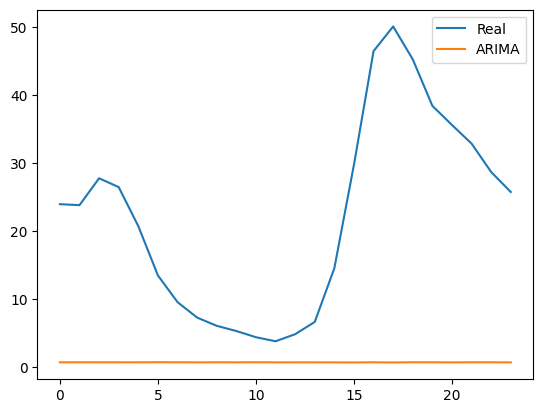

In [207]:
# Real
real = hourly_subset.copy()
real['hour'] = real.index.hour
real_profile = real.groupby('hour')['kWh'].mean()

# ARIMA
profiles = []
for s in scenarios_arima.values():
    temp = pd.DataFrame({'kWh': s.values}, index=s.index)
    temp['hour'] = temp.index.hour
    profiles.append(temp.groupby('hour')['kWh'].mean())

arima_profile = np.mean(profiles, axis=0)

plt.plot(real_profile, label='Real')
plt.plot(arima_profile, label='ARIMA')
plt.legend()
plt.show()

D. Variability across scenarios

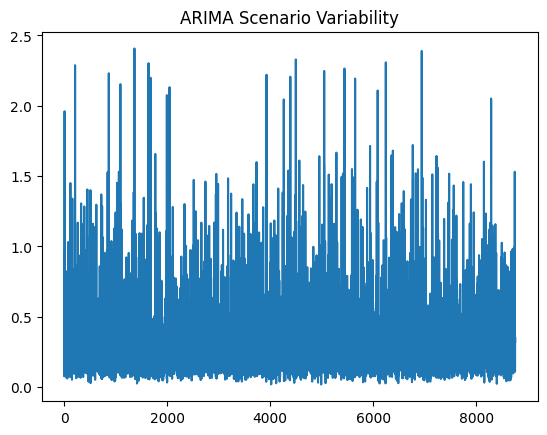

In [208]:
all_scenarios = np.array([s.values for s in scenarios_arima.values()])

std_over_time = all_scenarios.std(axis=0)

plt.plot(std_over_time)
plt.title("ARIMA Scenario Variability")
plt.show()

In [284]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA

# Ensure hourly frequency
hourly_subset = hourly_subset.copy()
hourly_subset = hourly_subset.resample('h').sum()

# Remove negatives (if any)
hourly_subset['kWh'] = hourly_subset['kWh'].clip(lower=0)

# Extract series
series = hourly_subset['kWh']

In [285]:
# Log transform for stability
log_series = np.log1p(series)

# Fit ARIMA
model = ARIMA(log_series, order=(2,1,2))
model_fit = model.fit()

c:\Users\betsie_0410\energiapy\.conda\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
c:\Users\betsie_0410\energiapy\.conda\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
c:\Users\betsie_0410\energiapy\.conda\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [286]:
forecast_log = model_fit.forecast(steps=8760)

# Back to kWh scale
forecast = np.expm1(forecast_log)
forecast = np.clip(forecast, 0, None)

In [287]:
# Clean residuals (log scale!)
residuals_log = pd.Series(model_fit.resid).dropna().values

# Time index for new year
time_index = pd.date_range('2019-01-01 00:00:00', periods=8760, freq='h')

scenarios_arima = {}

forecast_log_vals = np.array(forecast_log)

for s in range(5):
    noise_log = np.random.choice(residuals_log, size=8760)

    scenario_log = forecast_log_vals + noise_log
    scenario = np.expm1(scenario_log)

    scenario = np.clip(scenario, 0, None)

    scenarios_arima[f"Scenario_{s+1}"] = pd.Series(scenario, index=time_index)

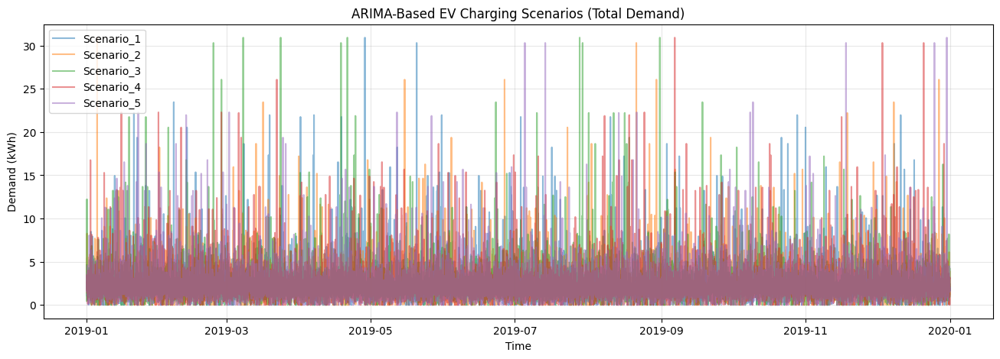

In [288]:
plt.figure(figsize=(16,5))

for name, series_s in scenarios_arima.items():
    plt.plot(series_s.index, series_s.values, alpha=0.5, label=name)

plt.title("ARIMA-Based EV Charging Scenarios (Total Demand)")
plt.xlabel("Time")
plt.ylabel("Demand (kWh)")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

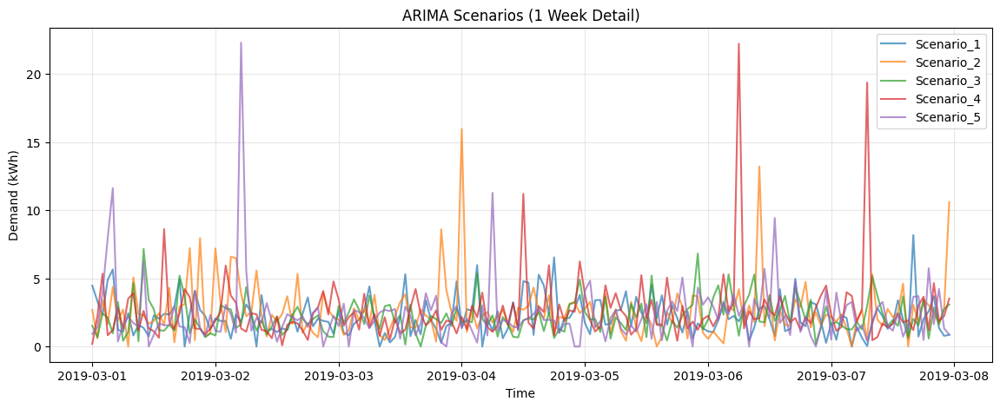

In [289]:
start = '2019-03-01'
end = '2019-03-07'

plt.figure(figsize=(14,5))

for name, series_s in scenarios_arima.items():
    plt.plot(series_s.loc[start:end].index,
             series_s.loc[start:end].values,
             alpha=0.7,
             label=name)

plt.title("ARIMA Scenarios (1 Week Detail)")
plt.xlabel("Time")
plt.ylabel("Demand (kWh)")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

In [290]:
for name, s in scenarios_arima.items():
    print(name,
          "mean:", s.mean(),
          "std:", s.std(),
          "peak:", s.max())

Scenario_1 mean: 2.3571211895259685 std: 1.9729568740878654 peak: 30.917434873723103
Scenario_2 mean: 2.3736014393943923 std: 1.92493070714253 peak: 30.917788776003892
Scenario_3 mean: 2.391126984967413 std: 2.0713506826122687 peak: 30.917434873723103
Scenario_4 mean: 2.4039810135809314 std: 2.047360794928997 peak: 30.917434873723103
Scenario_5 mean: 2.363426218584641 std: 2.0104357873922996 peak: 30.917434873723103


## EV loads

Step 1: make your clustering scenarios accessible

In [314]:
print(scenarios.keys())

dict_keys(['scenario_1', 'scenario_2', 'scenario_3', 'scenario_4', 'scenario_5'])


In [315]:
scenarios["scenario_1"]   # DataFrame with index = 8760 timestamps
scenarios["scenario_1"]["kWh"]

2019-01-01 00:00:00    0.670923
2019-01-01 01:00:00    0.702563
2019-01-01 02:00:00    0.852598
2019-01-01 03:00:00    0.808976
2019-01-01 04:00:00    0.610189
                         ...   
2019-12-31 19:00:00    1.084630
2019-12-31 20:00:00    0.989423
2019-12-31 21:00:00    0.885750
2019-12-31 22:00:00    0.762231
2019-12-31 23:00:00    0.679951
Freq: h, Name: kWh, Length: 8760, dtype: float64

In [316]:
ev_profiles = {}

for name, df_s in scenarios.items():
    prof = df_s['kWh'].copy()
    prof = prof / prof.sum()   # normalize so sum = 1
    ev_profiles[name] = prof

Now each ev_profiles[name] is a shape only.

In [317]:
for name, prof in ev_profiles.items():
    print(name, prof.sum(), prof.min(), prof.max())

scenario_1 1.0 7.659682834177579e-06 0.00037983718301330677
scenario_2 1.0000000000000002 7.65968283417758e-06 0.00037983718301330677
scenario_3 1.0 7.659682834177579e-06 0.00037983718301330677
scenario_4 1.0000000000000002 7.65968283417758e-06 0.00037983718301330677
scenario_5 1.0000000000000002 7.659682834177579e-06 0.0003798371830133068


Plot the full-year normalized profiles

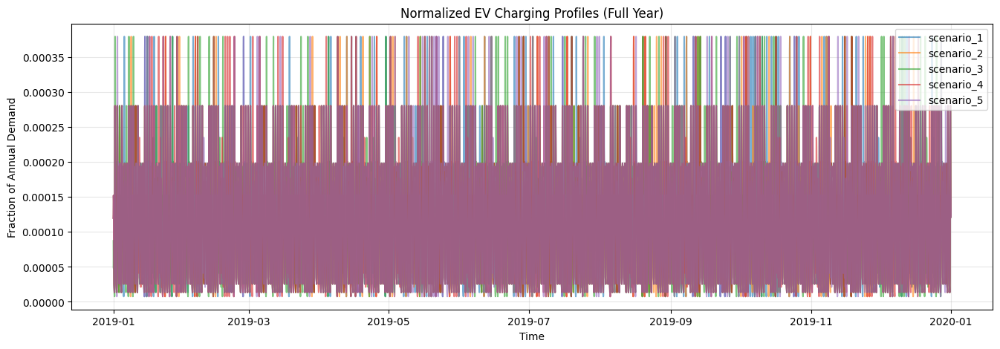

In [318]:
plt.figure(figsize=(16,5))

for name, prof in ev_profiles.items():
    plt.plot(prof.index, prof.values, alpha=0.6, label=name)

plt.title("Normalized EV Charging Profiles (Full Year)")
plt.xlabel("Time")
plt.ylabel("Fraction of Annual Demand")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

Plot one week only

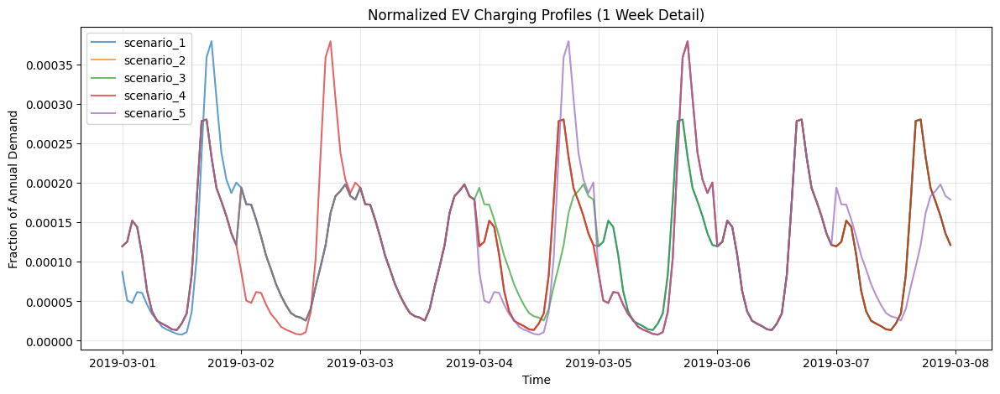

In [319]:
start = '2019-03-01'
end = '2019-03-07'

plt.figure(figsize=(14,5))

for name, prof in ev_profiles.items():
    plt.plot(prof.loc[start:end].index,
             prof.loc[start:end].values,
             alpha=0.7,
             label=name)

plt.title("Normalized EV Charging Profiles (1 Week Detail)")
plt.xlabel("Time")
plt.ylabel("Fraction of Annual Demand")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

Plot average daily shapes

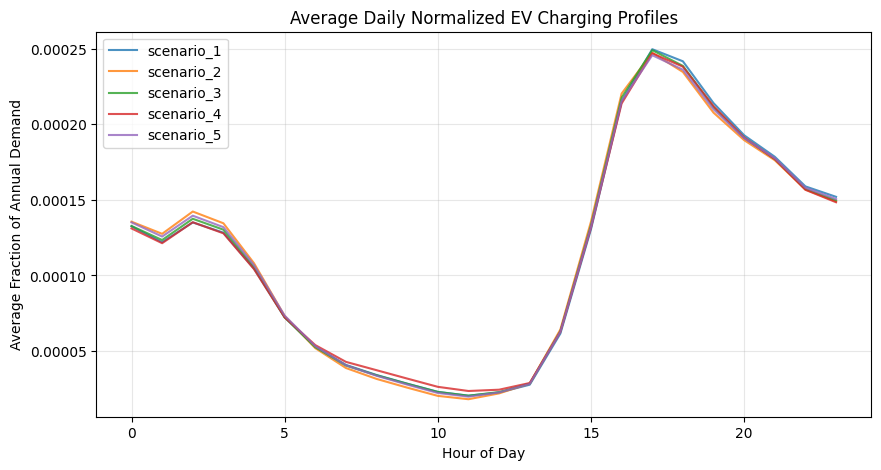

In [320]:
plt.figure(figsize=(10,5))

for name, prof in ev_profiles.items():
    temp = prof.to_frame(name='profile').copy()
    temp['hour'] = temp.index.hour
    avg_day = temp.groupby('hour')['profile'].mean()

    plt.plot(avg_day.index, avg_day.values, alpha=0.8, label=name)

plt.title("Average Daily Normalized EV Charging Profiles")
plt.xlabel("Hour of Day")
plt.ylabel("Average Fraction of Annual Demand")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

Bar plot of daily totals

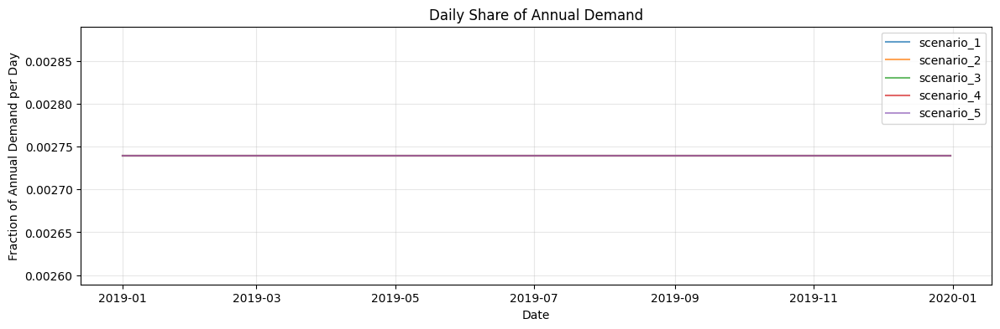

In [321]:
plt.figure(figsize=(14,4))

for name, prof in ev_profiles.items():
    daily = prof.resample('D').sum()
    plt.plot(daily.index, daily.values, alpha=0.7, label=name)

plt.title("Daily Share of Annual Demand")
plt.xlabel("Date")
plt.ylabel("Fraction of Annual Demand per Day")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

Compare one normalized profile against the original kWh profile

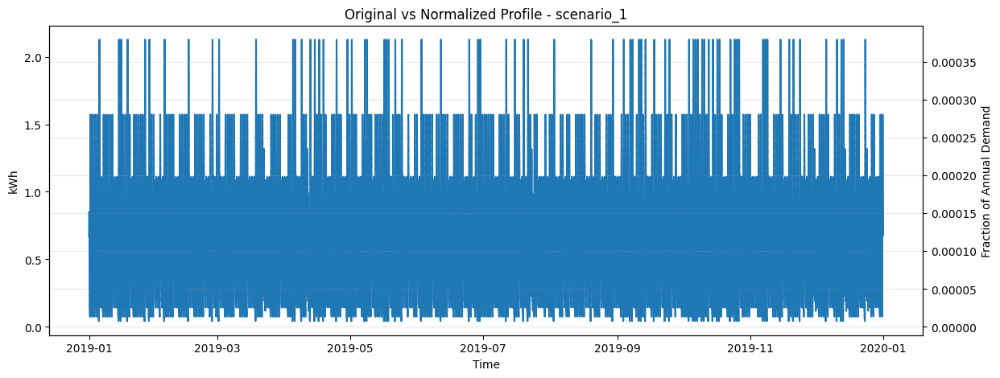

In [323]:
name = list(ev_profiles.keys())[0]

fig, ax1 = plt.subplots(figsize=(14,5))

ax1.plot(scenarios[name].index, scenarios[name]['kWh'], label='Original kWh')
ax1.set_xlabel("Time")
ax1.set_ylabel("kWh")

ax2 = ax1.twinx()
ax2.plot(ev_profiles[name].index, ev_profiles[name].values, linestyle='--', alpha=0.7, label='Normalized profile')
ax2.set_ylabel("Fraction of Annual Demand")

plt.title(f"Original vs Normalized Profile - {name}")
plt.grid(alpha=0.3)
plt.show()

Scale back to 1 EV and compare

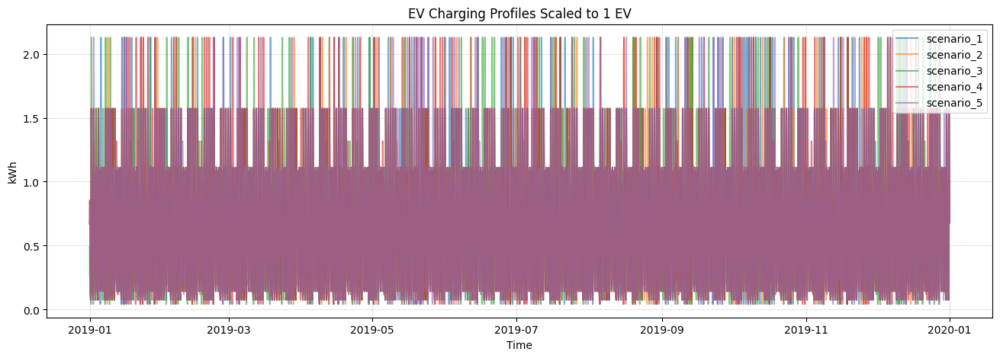

In [324]:
annual_ev_energy = 5600  # kWh/year

plt.figure(figsize=(16,5))

for name, prof in ev_profiles.items():
    one_ev = prof * annual_ev_energy
    plt.plot(one_ev.index, one_ev.values, alpha=0.6, label=name)

plt.title("EV Charging Profiles Scaled to 1 EV")
plt.xlabel("Time")
plt.ylabel("kWh")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

OPTION 1 — Export to JSON (BEST for code-to-code)
🔹 Save all scenarios into one JSON